In [3]:
import os
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy.stats import spearmanr
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform
from scipy.stats import kendalltau

In [4]:
# Define path
extracted_folder = 'Dataset'

# Load the edges
edges = pd.read_csv(os.path.join(extracted_folder,'london_transport_multiplex.edges'), sep=' ', header=None, names=['layer', 'source', 'target', 'weight'])

# Load node details
nodes = pd.read_csv(os.path.join(extracted_folder,'london_transport_nodes.txt'), sep=' ', header=0, names=['nodeID', 'nodeLabel', 'nodeLat', 'nodeLong'])

# Load layer data
layers_df = pd.read_csv(os.path.join(extracted_folder, 'london_transport_layers.txt'), sep=' ', header=0, names=['layerID', 'layerLabel'])

# Load disruption data
disruptions_df = pd.read_csv(os.path.join(extracted_folder, 'london_transport_disruptions_summary.txt'), sep=' ', header=None, names=['DisruptionID', 'Line', 'Station_A', 'Station_B', 'Frequency', 'Affected_nodes'])


In [5]:
nodes.head()

,nodeID,nodeLabel,nodeLat,nodeLong
0,0,abbeyroad,51.531952,0.003738
1,1,westham,51.528526,0.005332
2,2,actoncentral,51.508758,-0.263416
3,3,willesdenjunction,51.532234,-0.243895
4,4,actontown,51.503071,-0.280288


In [6]:
edges.head()

,layer,source,target,weight
0,1,1,77,2
1,1,1,106,1
2,1,1,219,1
3,1,1,321,2
4,1,3,224,1


In [7]:
layers_df

,layerID,layerLabel
0,1,Tube
1,2,Overground
2,3,DLR


In [8]:
disruptions_df.head()

,DisruptionID,Line,Station_A,Station_B,Frequency,Affected_nodes
0,DISR1,metropolitan,aldgate,bakerstreet,3.3457,2.439
1,DISR2,hammersmith&city,barking,moorgate,2.8914,3.523
2,DISR3,dlr,beckton,canningtown,2.5609,2.439
3,DISR4,overground,claphamjunction,surreyquays,2.0240,1.897
4,DISR5,overground,richmond,willesdenjunction,1.9413,1.626


### Calculate the Centrality Measures for the Tube Stops of the TFL network

#### Load and Prepare Data

In [8]:
# Create a dictionary for node labels
node_labels = dict(zip(nodes['nodeID'], nodes['nodeLabel']))

# Create the graph
G = nx.Graph()

# Add nodes with attributes
for _, row in nodes.iterrows():
    G.add_node(row['nodeID'], label=row['nodeLabel'], lat=row['nodeLat'], long=row['nodeLong'])

# Add edges with weights
for _, row in edges.iterrows():
    G.add_edge(row['source'], row['target'], weight=row['weight'], layer=row['layer'])


#### Calculate Centrality Measures

In [9]:
# Degree Centrality
degree_centrality = nx.degree_centrality(G)

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(G, weight='weight')

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(G)

# Eigenvector Centrality
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)

# PageRank Centrality
pagerank_centrality = nx.pagerank(G, weight='weight')

# Prepare centrality measures as a DataFrame
centrality_df = pd.DataFrame({
    'Node': list(G.nodes),
    'Label': [G.nodes[node]['label'] for node in G.nodes],
    'Degree Centrality': [degree_centrality[node] for node in G.nodes],
    'Betweenness Centrality': [betweenness_centrality[node] for node in G.nodes],
    'Closeness Centrality': [closeness_centrality[node] for node in G.nodes],
    'Eigenvector Centrality': [eigenvector_centrality[node] for node in G.nodes],
    'PageRank Centrality': [pagerank_centrality[node] for node in G.nodes]
})

# Display the centrality measures
centrality_df.head()


,Node,Label,Degree Centrality,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality,PageRank Centrality
0,0,abbeyroad,0.005435,0.000602,0.079688,0.001668,0.001872
1,1,westham,0.016304,0.099183,0.086527,0.004175,0.005984
2,2,actoncentral,0.005435,0.067237,0.084812,0.000383,0.002216
3,3,willesdenjunction,0.013587,0.194865,0.091338,0.001300,0.004977
4,4,actontown,0.010870,0.068029,0.074858,0.000222,0.004589


#### Visualization of Centrality Measures

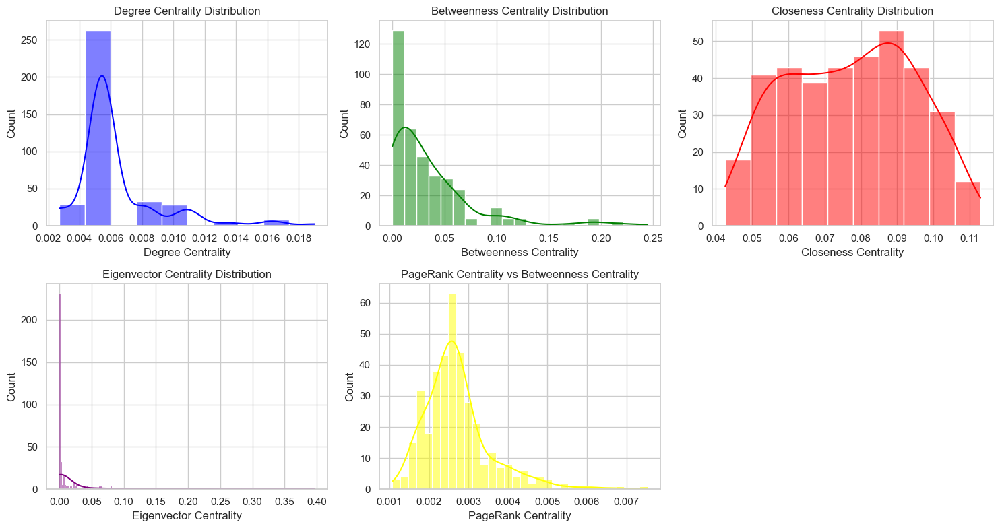

In [10]:
# Visualization of Centrality Measures
plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")

# Degree Centrality Distribution
plt.subplot(2, 3, 1)
sns.histplot(centrality_df['Degree Centrality'], kde=True, color='blue')
plt.title('Degree Centrality Distribution')

# Betweenness Centrality Distribution
plt.subplot(2,3, 2)
sns.histplot(centrality_df['Betweenness Centrality'], kde=True, color='green')
plt.title('Betweenness Centrality Distribution')

# Closeness Centrality Distribution
plt.subplot(2, 3, 3)
sns.histplot(centrality_df['Closeness Centrality'], kde=True, color='red')
plt.title('Closeness Centrality Distribution')

# Eigenvector Centrality Distribution
plt.subplot(2, 3, 4)
sns.histplot(centrality_df['Eigenvector Centrality'], kde=True, color='purple')
plt.title('Eigenvector Centrality Distribution')

# PageRank Centrality distribution
plt.subplot(2, 3, 5)
sns.histplot(centrality_df['PageRank Centrality'], kde=True, color='yellow')
plt.title('PageRank Centrality vs Betweenness Centrality')


plt.tight_layout()
plt.show()

#### Scatter Plot Visualization of centrality measures

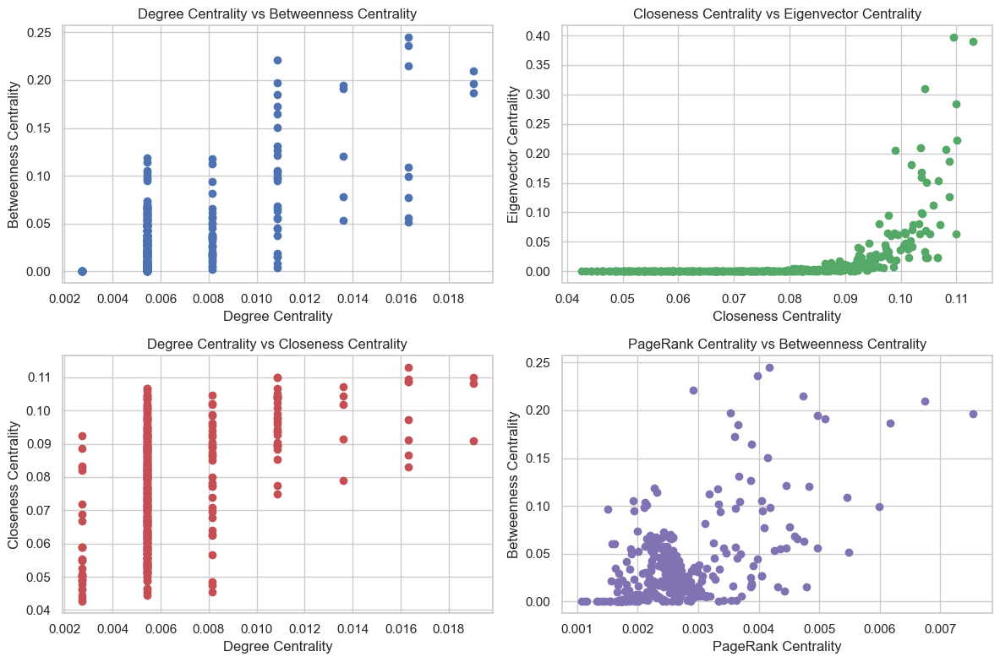

In [11]:
# Visualization of Centrality Measures
plt.figure(figsize=(12, 8))

# Scatter plot for Degree Centrality vs Betweenness Centrality
plt.subplot(2, 2, 1)
plt.scatter(centrality_df['Degree Centrality'], centrality_df['Betweenness Centrality'], color='b')
plt.title('Degree Centrality vs Betweenness Centrality')
plt.xlabel('Degree Centrality')
plt.ylabel('Betweenness Centrality')

# Scatter plot for Closeness Centrality vs Eigenvector Centrality
plt.subplot(2, 2, 2)
plt.scatter(centrality_df['Closeness Centrality'], centrality_df['Eigenvector Centrality'], color='g')
plt.title('Closeness Centrality vs Eigenvector Centrality')
plt.xlabel('Closeness Centrality')
plt.ylabel('Eigenvector Centrality')

# Scatter plot for Degree Centrality vs Closeness Centrality
plt.subplot(2, 2, 3)
plt.scatter(centrality_df['Degree Centrality'], centrality_df['Closeness Centrality'], color='r')
plt.title('Degree Centrality vs Closeness Centrality')
plt.xlabel('Degree Centrality')
plt.ylabel('Closeness Centrality')

# Scatter plot for PageRank Centrality vs Betweenness Centrality
plt.subplot(2, 2, 4)
plt.scatter(centrality_df['PageRank Centrality'], centrality_df['Betweenness Centrality'], color='m')
plt.title('PageRank Centrality vs Betweenness Centrality')
plt.xlabel('PageRank Centrality')
plt.ylabel('Betweenness Centrality')

plt.tight_layout()
plt.show()


#### Visualizing the network with centrality measures

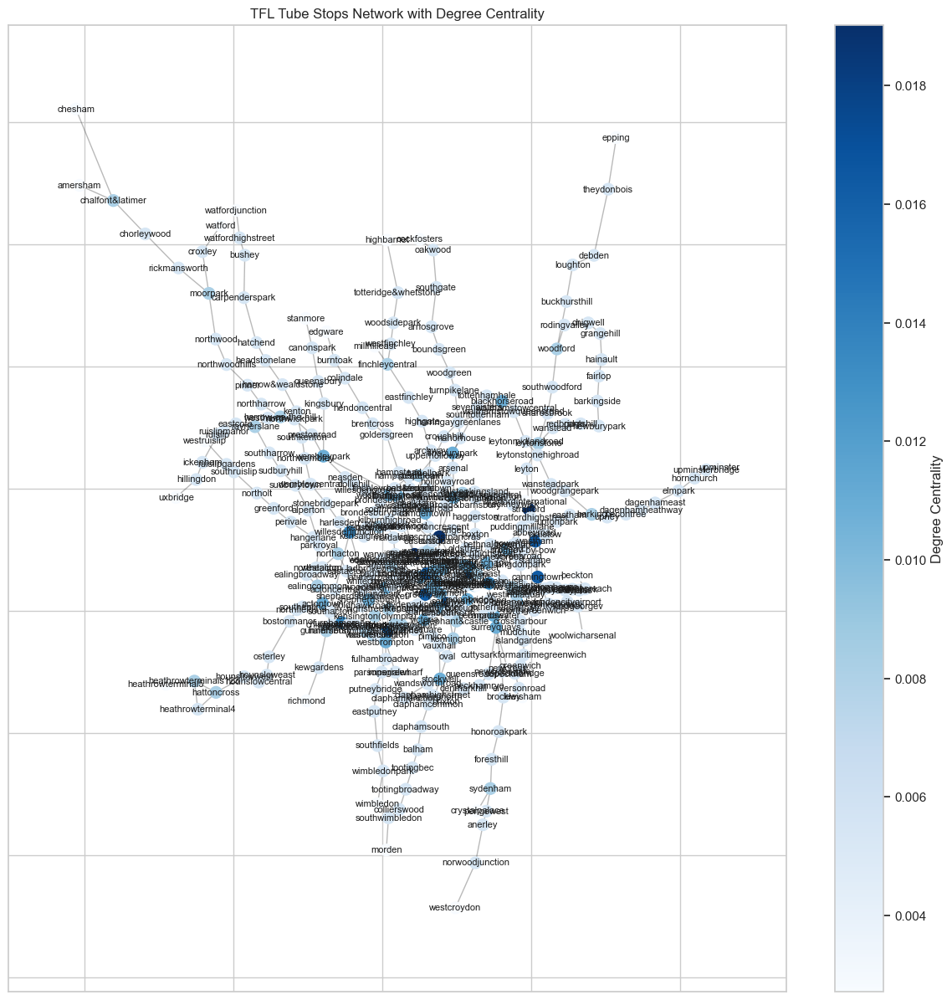

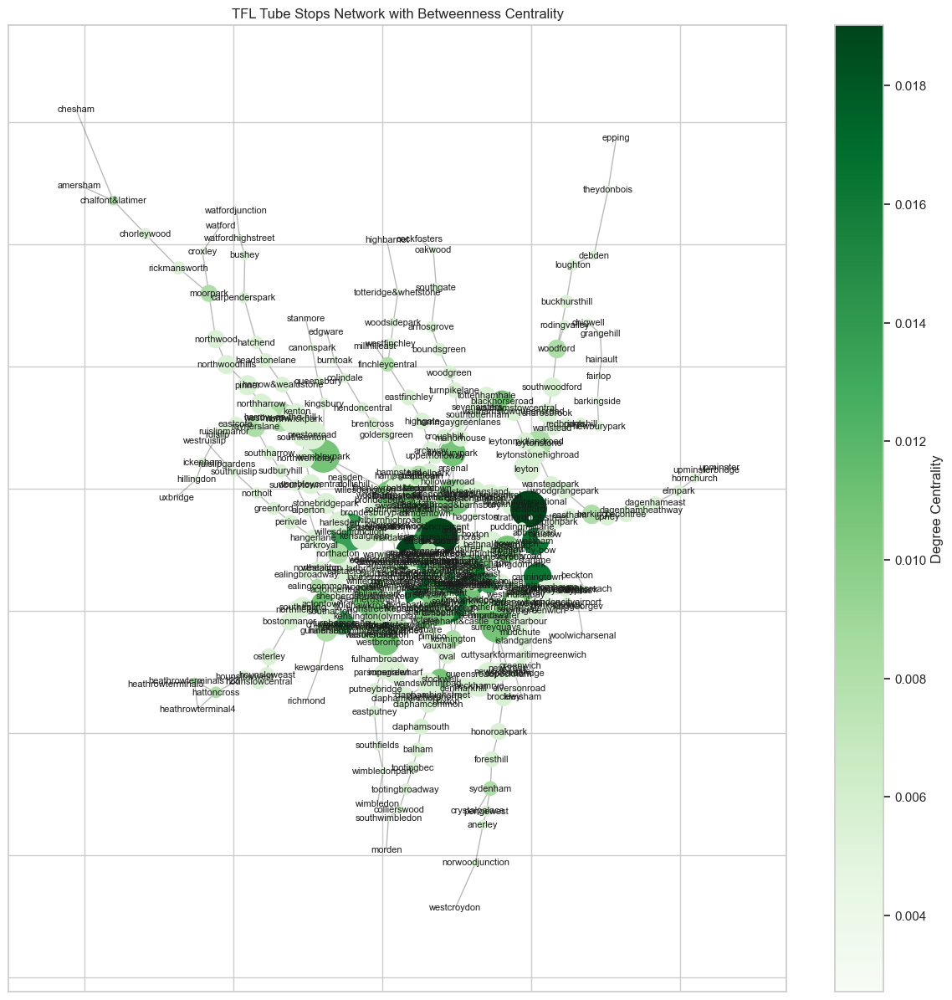

In [18]:
# Positioning of nodes based on latitude and longitude
pos = {node: (G.nodes[node]['long'], G.nodes[node]['lat']) for node in G.nodes}

# Node color based on Degree Centrality
node_color = [degree_centrality[node] for node in G.nodes]

# Plot with Degree Centrality
fig, ax = plt.subplots(figsize=(15, 15))
nx.draw_networkx_nodes(G, pos, ax=ax, node_size=100, node_color=node_color, cmap=plt.cm.Blues)
nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.3)
nx.draw_networkx_labels(G, pos, ax=ax, labels=node_labels, font_size=8)
plt.title("TFL Tube Stops Network with Degree Centrality")

# Create ScalarMappable for colorbar
sm = mpl.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(vmin=min(node_color), vmax=max(node_color)))
sm.set_array([])  # array for the colorbar
plt.colorbar(sm, ax=ax, label='Degree Centrality')  # Link colorbar to ax

plt.show()

# Network with Betweenness Centrality as node size
node_size = [5000 * betweenness_centrality[node] for node in G.nodes]

fig, ax = plt.subplots(figsize=(15, 15))
nx.draw_networkx_nodes(G, pos, ax=ax, node_size=node_size, node_color=node_color, cmap=plt.cm.Greens)
nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.3)
nx.draw_networkx_labels(G, pos, ax=ax, labels=node_labels, font_size=8)
plt.title("TFL Tube Stops Network with Betweenness Centrality")

# Create ScalarMappable for colorbar
sm = mpl.cm.ScalarMappable(cmap=plt.cm.Greens, norm=plt.Normalize(vmin=min(node_color), vmax=max(node_color)))
sm.set_array([])  # array for the colorbar
plt.colorbar(sm, ax=ax, label='Degree Centrality')  # Link colorbar to ax

plt.show()


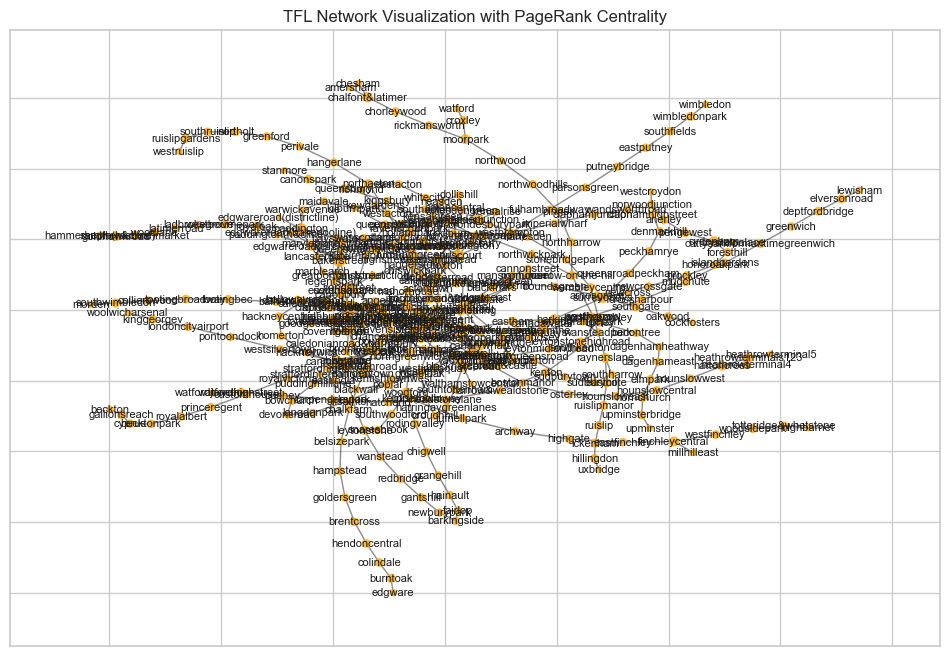

In [19]:
# Visualization of Network with PageRank Centrality as Node Size
plt.figure(figsize=(12, 8))
node_size = [10000 * pagerank_centrality[node] for node in G.nodes]
pos = nx.spring_layout(G)  # Layout for visualization

nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color='orange', alpha=0.7)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

plt.title('TFL Network Visualization with PageRank Centrality')
plt.show()

#### Understanding the Impact of Disruptions on the network by looking at how the Centrality Measures Change

In [20]:
# Function to simulate disruption by removing affected nodes or edges
def simulate_disruption(graph, disruptions_df):
    disrupted_graphs = []
    
    for _, disruption in disruptions_df.iterrows():
        G_disrupted = graph.copy()
        
        affected_nodes_value = disruption['Affected_nodes']
        
        if pd.notna(affected_nodes_value):  # Check if the value is not NaN
            affected_nodes_str = str(int(affected_nodes_value))  # Convert float to int and then to string
            if affected_nodes_str:
                try:
                    affected_nodes = [affected_nodes_str]  # Handle single node values
                    # Remove affected nodes from the graph
                    G_disrupted.remove_nodes_from(affected_nodes)
                except ValueError as e:
                    print(f"Error processing nodes: {e}")
                    continue
        else:
            print(f"Missing or invalid Affected_nodes value: {affected_nodes_value}")
        
        disrupted_graphs.append(G_disrupted)
    
    return disrupted_graphs

# Generate a list of disrupted graphs
disrupted_graphs = simulate_disruption(G, disruptions_df)

In [21]:
# Function to calculate centrality measures for a graph
def calculate_centrality_measures(graph):
    degree_centrality = nx.degree_centrality(graph)
    betweenness_centrality = nx.betweenness_centrality(graph, weight='weight')
    closeness_centrality = nx.closeness_centrality(graph)
    pagerank_centrality = nx.pagerank(graph, weight='weight')
    
    centrality_df = pd.DataFrame({
        'Node': list(graph.nodes),
        'Degree Centrality': [degree_centrality[node] for node in graph.nodes],
        'Betweenness Centrality': [betweenness_centrality[node] for node in graph.nodes],
        'Closeness Centrality': [closeness_centrality[node] for node in graph.nodes],
        'PageRank Centrality': [pagerank_centrality[node] for node in graph.nodes]
    })
    
    return centrality_df

# Calculate centrality measures for each disrupted graph
disrupted_centrality_dfs = [calculate_centrality_measures(G_disrupted) for G_disrupted in disrupted_graphs]

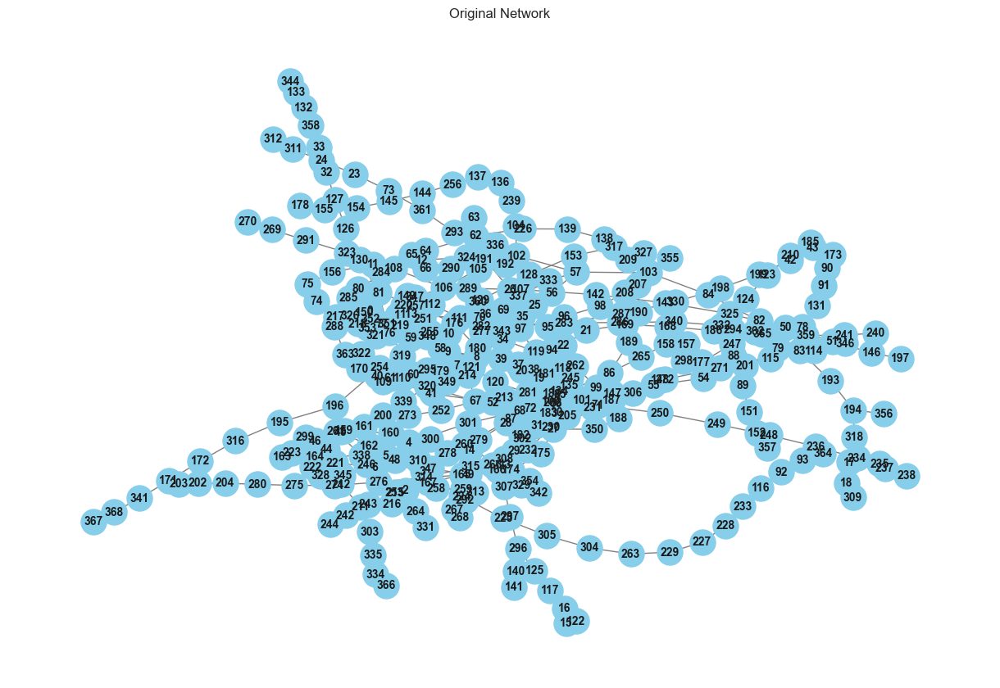

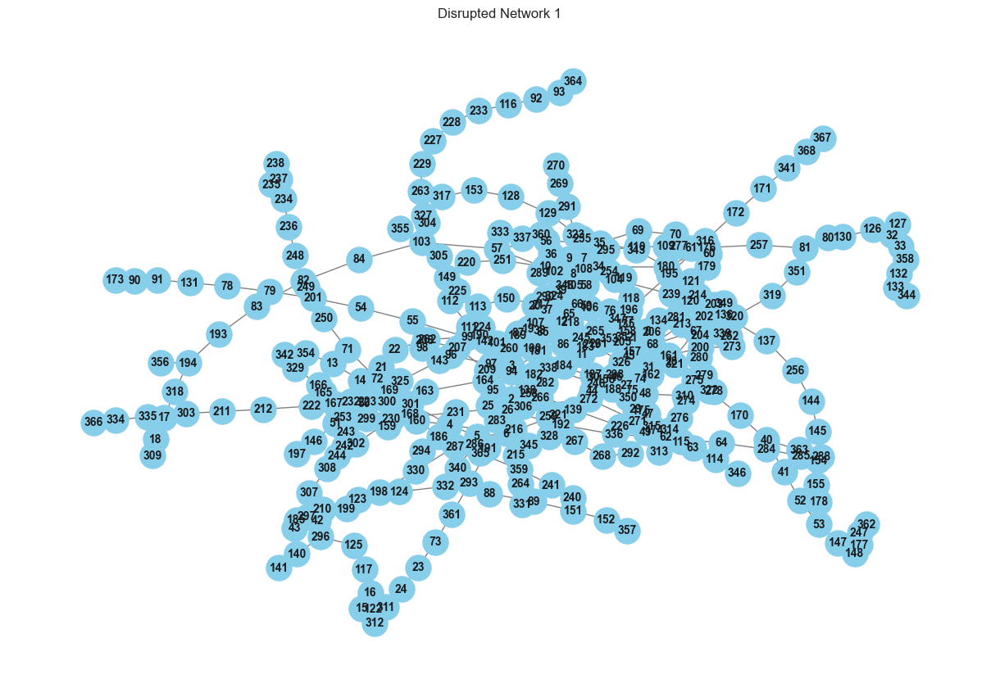

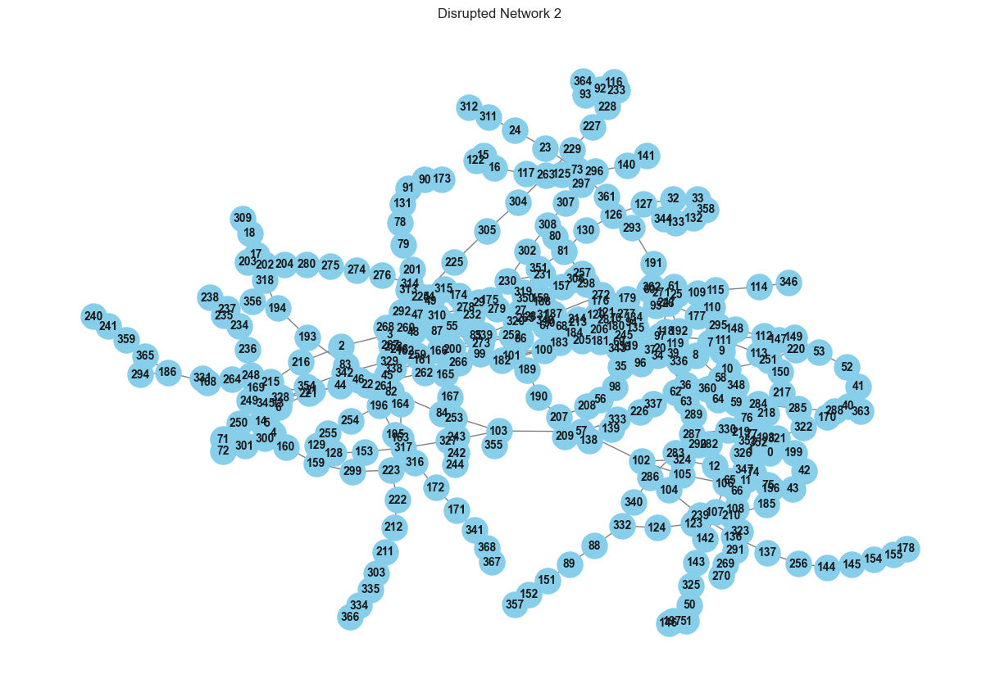

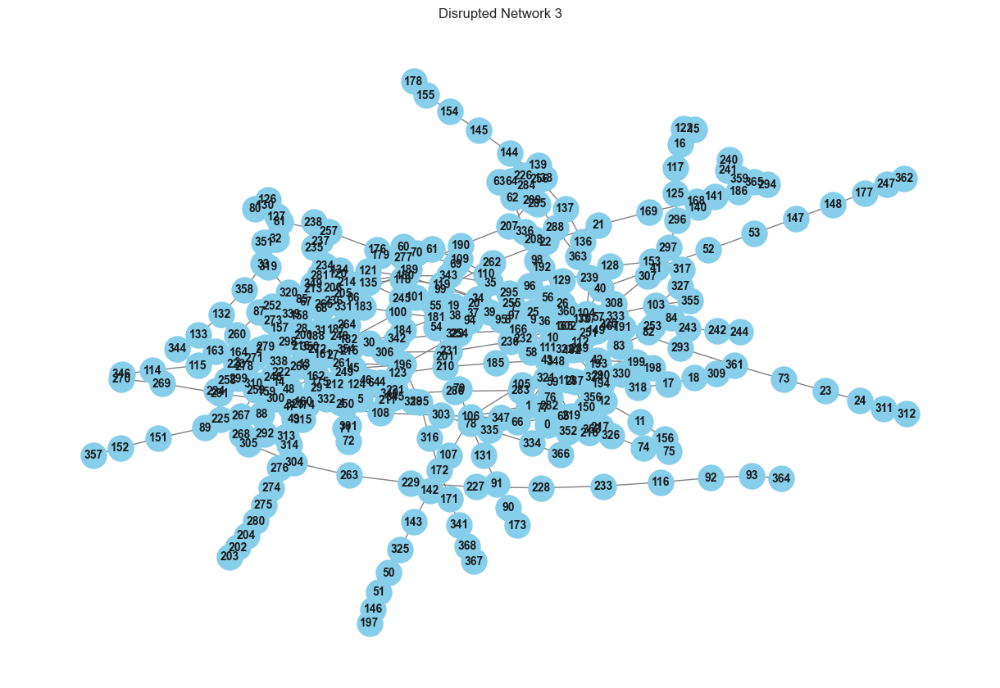

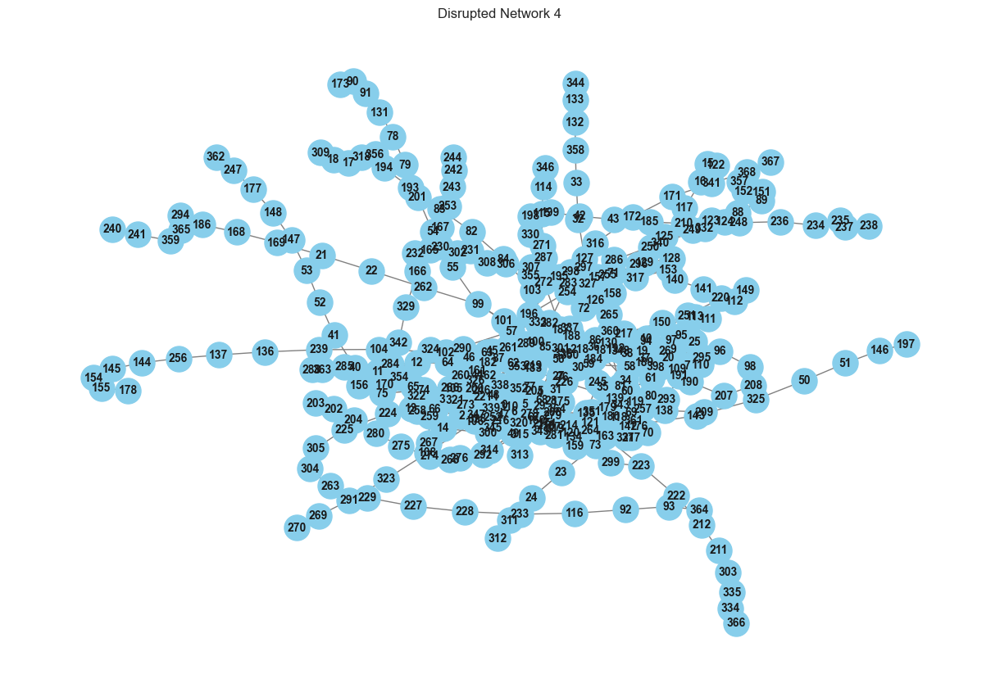

...

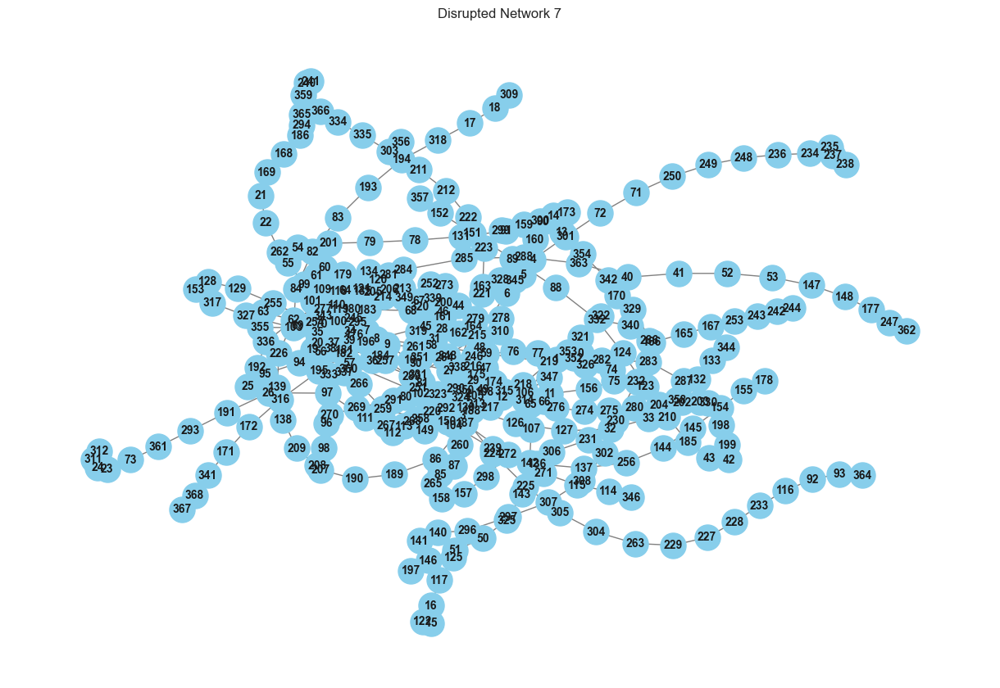

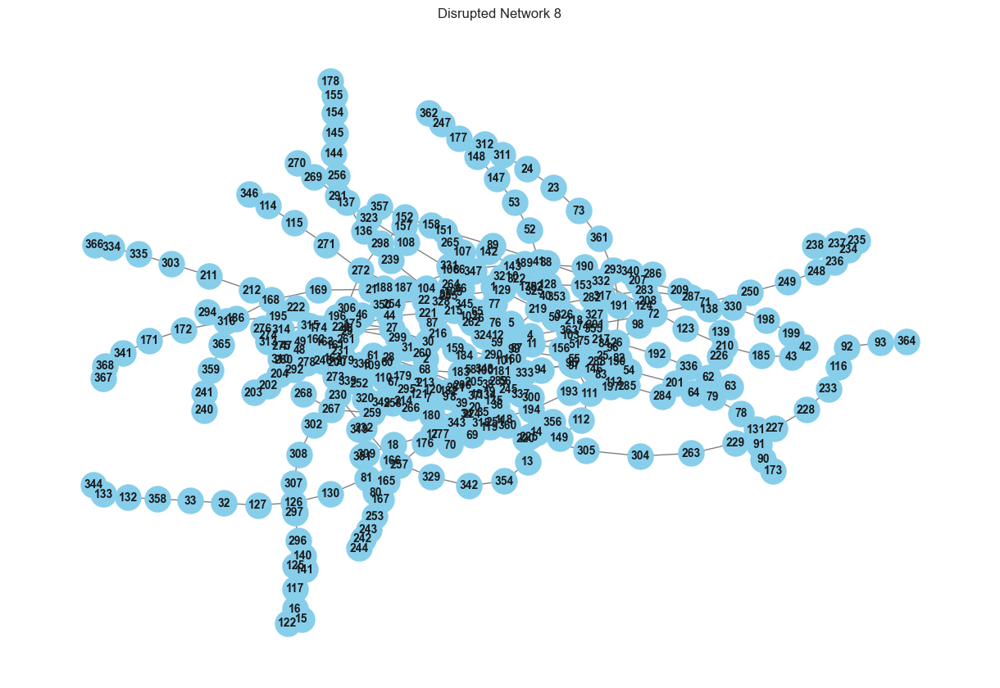

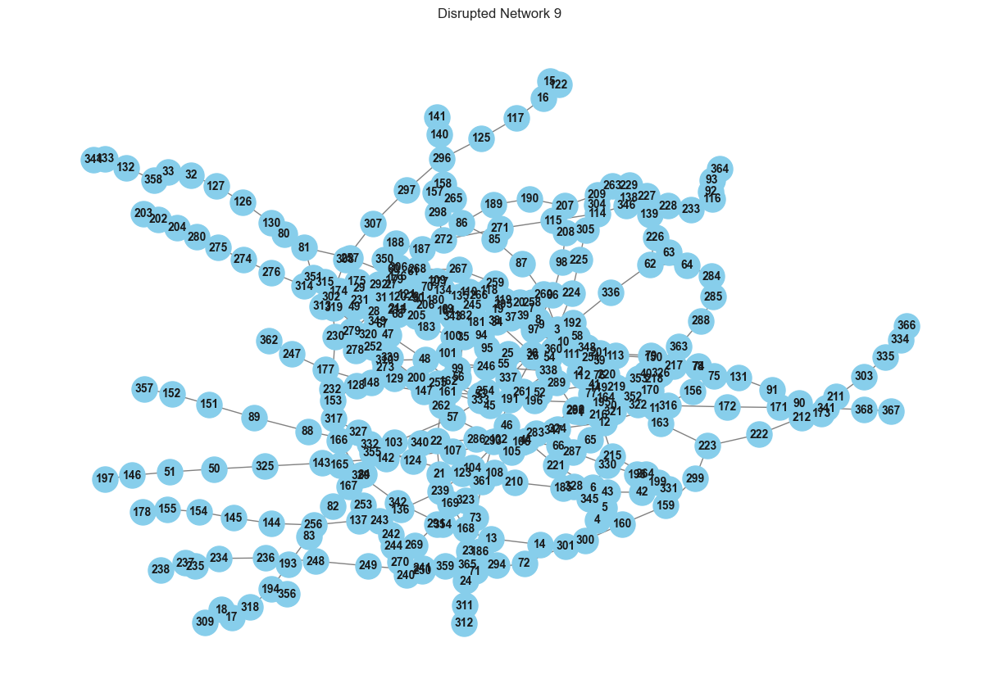

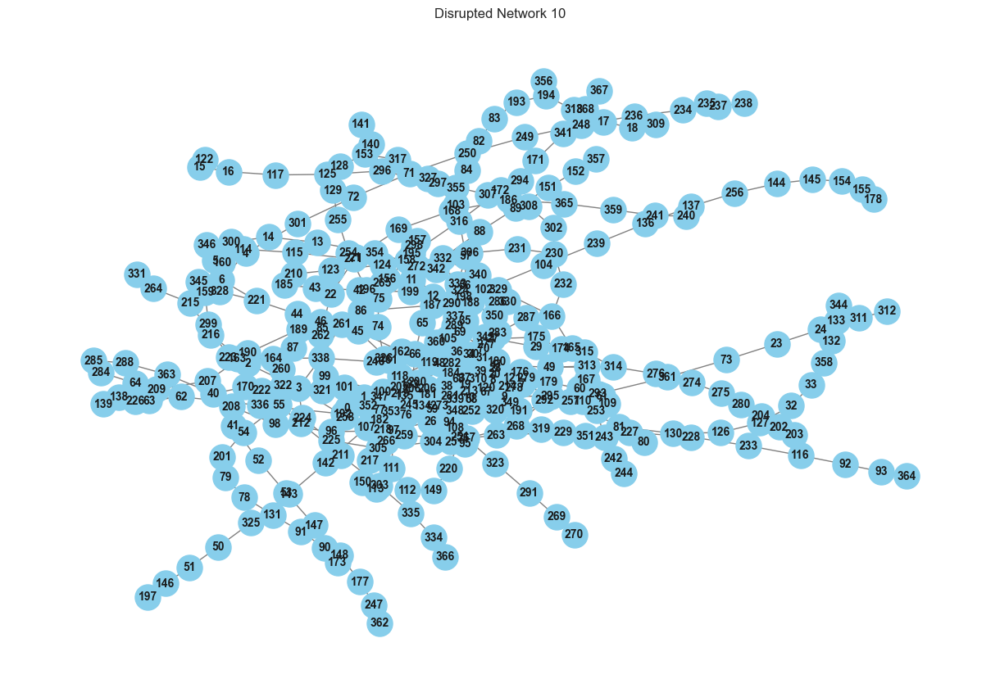

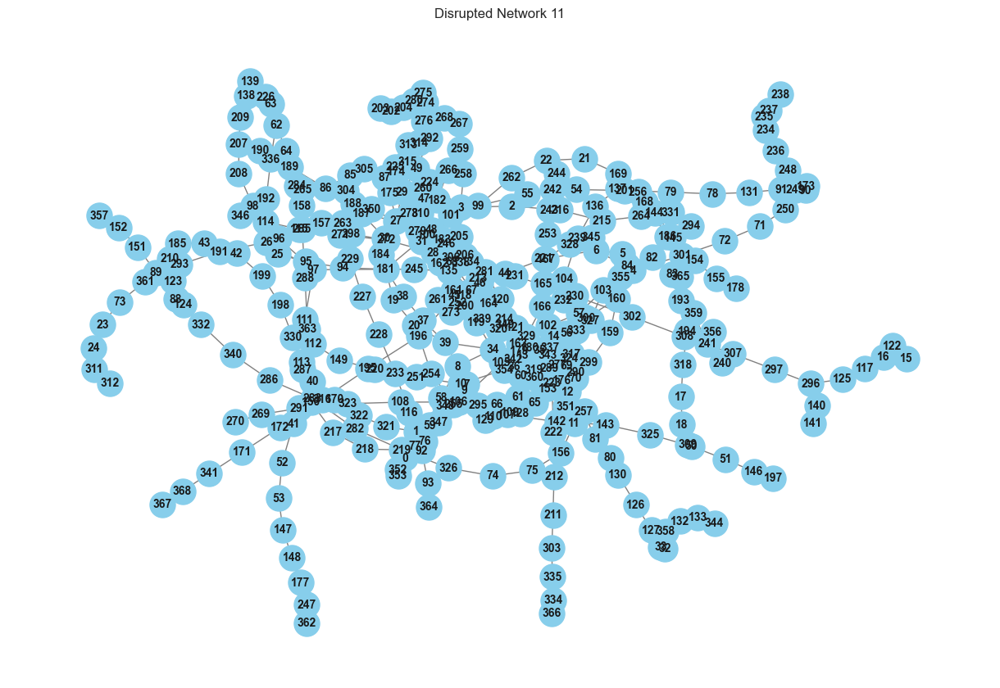

In [22]:
def plot_graph(graph, title):
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(graph)
    nx.draw(graph, pos, with_labels=True, node_color='skyblue', node_size=500, edge_color='gray', font_size=10, font_weight='bold')
    plt.title(title)
    plt.show()

# Plot original graph
plot_graph(G, "Original Network")

# Plot disrupted graphs
for i, G_disrupted in enumerate(disrupted_graphs):
    plot_graph(G_disrupted, f"Disrupted Network {i+1}")
    if i+1 == 11:
        break

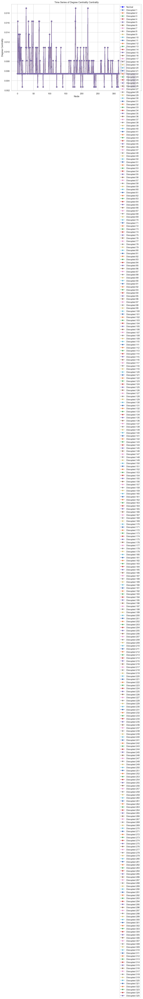

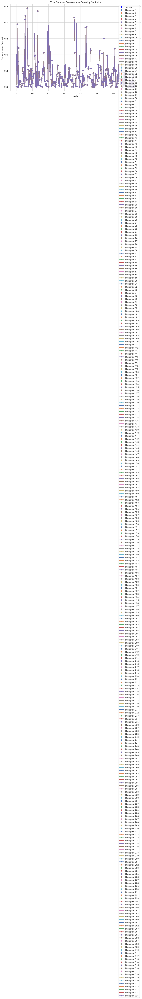

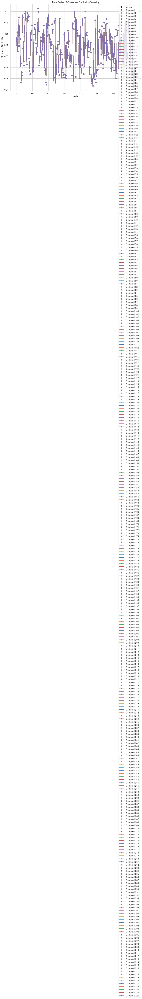

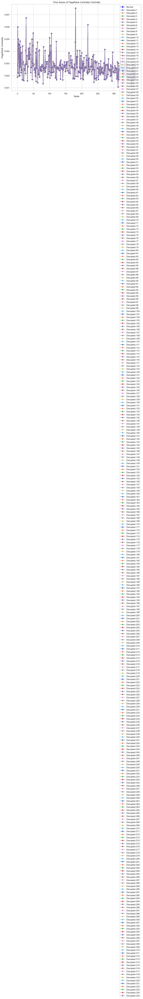

In [23]:
def plot_centrality_time_series(normal_df, disrupted_dfs, centrality_measure):
    plt.figure(figsize=(12, 8))
    
    # Plot centrality for normal graph
    plt.plot(normal_df['Node'], normal_df[centrality_measure], 'o-', label='Normal', color='blue')
    
    # Plot centrality for disrupted graphs
    for i, disrupted_df in enumerate(disrupted_dfs):
        plt.plot(disrupted_df['Node'], disrupted_df[centrality_measure], 'o-', label=f'Disrupted {i+1}')
    
    plt.title(f'Time Series of {centrality_measure} Centrality')
    plt.xlabel('Node')
    plt.ylabel(f'{centrality_measure}')
    plt.legend()
    plt.show()

# Plot time series for each centrality measure
for measure in ['Degree Centrality', 'Betweenness Centrality', 'Closeness Centrality', 'PageRank Centrality']:
    plot_centrality_time_series(centrality_df, disrupted_centrality_dfs, measure)


#### Compare rankings of stations during normal and disrupted conditions and cluster similar disruption events

C:\Users\Umer\networkenv\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


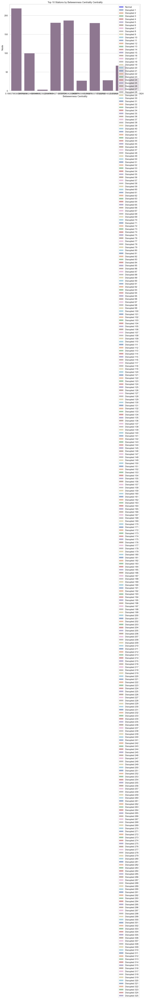

C:\Users\Umer\networkenv\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


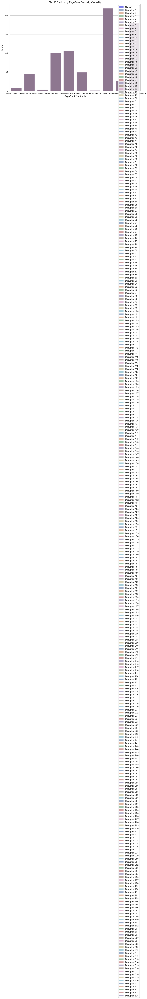

In [24]:
# Function to plot bar plots of top stations' centrality measures
def plot_top_stations_comparison(normal_df, disrupted_df_list, centrality_measure, top_n=10):
    # Get top N stations by centrality measure
    normal_top = normal_df[['Node', centrality_measure]].nlargest(top_n, centrality_measure)
    
    plt.figure(figsize=(12, 8))
    sns.barplot(x=centrality_measure, y='Node', data=normal_top, color='blue', alpha=0.6, label='Normal')

    # Plot top stations for each disrupted graph
    for i, disrupted_df in enumerate(disrupted_df_list):
        disrupted_top = disrupted_df[['Node', centrality_measure]].nlargest(top_n, centrality_measure)
        sns.barplot(x=centrality_measure, y='Node', data=disrupted_top, alpha=0.6, label=f'Disrupted {i+1}')
    
    plt.title(f'Top {top_n} Stations by {centrality_measure} Centrality')
    plt.xlabel(f'{centrality_measure}')
    plt.ylabel('Node')
    plt.legend()
    plt.show()

# Plot comparisons for top stations
for measure in ['Betweenness Centrality', 'PageRank Centrality']:
    plot_top_stations_comparison(centrality_df, disrupted_centrality_dfs, measure)

#### Analyzing Network Topology

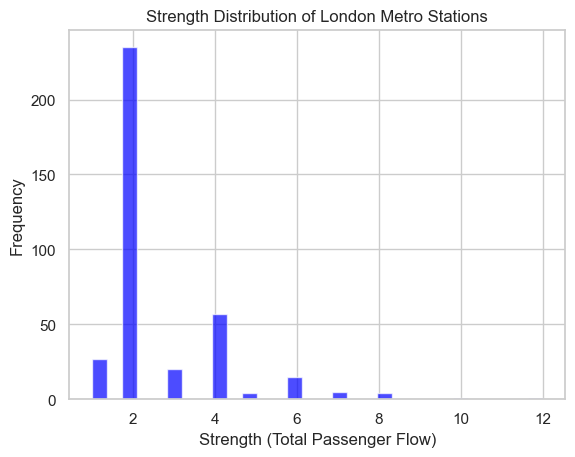

In [25]:
# Strength of each node is the sum of the weights of its edges
node_strength = {node: sum(data['weight'] for _, _, data in G.edges(node, data=True)) for node in G.nodes()}

# Plotting the strength distribution
strength_values = list(node_strength.values())
plt.hist(strength_values, bins=30, color='blue', alpha=0.7)
plt.title('Strength Distribution of London Metro Stations')
plt.xlabel('Strength (Total Passenger Flow)')
plt.ylabel('Frequency')
plt.show()


### Implementing the SIR Model

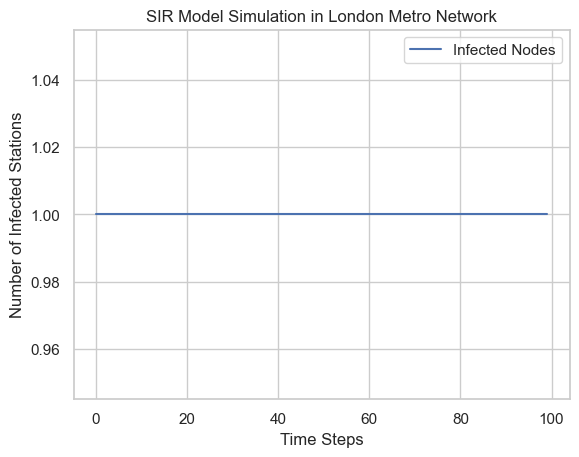

In [26]:
import random

def sir_model(G, beta, gamma, initial_infected, steps):
    """
    G: Graph representing the metro network
    beta: Transmission rate
    gamma: Recovery rate
    initial_infected: List of initially infected nodes
    steps: Number of time steps to simulate
    """
    # Initialize compartments
    S = {node: 1 for node in G.nodes()}  # Susceptible
    I = {node: 0 for node in G.nodes()}  # Infected
    R = {node: 0 for node in G.nodes()}  # Recovered

    # Infect initial nodes
    for node in initial_infected:
        S[node] = 0
        I[node] = 1

    infection_history = []

    # Simulate over the number of steps
    for t in range(steps):
        new_infections = []
        for node in G.nodes():
            if I[node] == 1:  # If node is infected
                for neighbor in G.neighbors(node):
                    if S[neighbor] == 1 and random.random() < beta:
                        new_infections.append(neighbor)

                if random.random() < gamma:
                    I[node] = 0
                    R[node] = 1

        for node in new_infections:
            S[node] = 0
            I[node] = 1
        
        infection_history.append(sum(I.values()))

    return infection_history


initial_infected = ['actontown']
beta = 0.3  
gamma = 0.1  
steps = 100

infection_history = sir_model(G, beta, gamma, initial_infected, steps)

# Plotting the infection history
plt.plot(infection_history, label='Infected Nodes')
plt.title('SIR Model Simulation in London Metro Network')
plt.xlabel('Time Steps')
plt.ylabel('Number of Infected Stations')
plt.legend()
plt.show()


#### Analyzing Network Disruption

After removing 50:
  - Largest connected component size: 365
  - Number of connected components: 2
  - Maximum Flow: 1


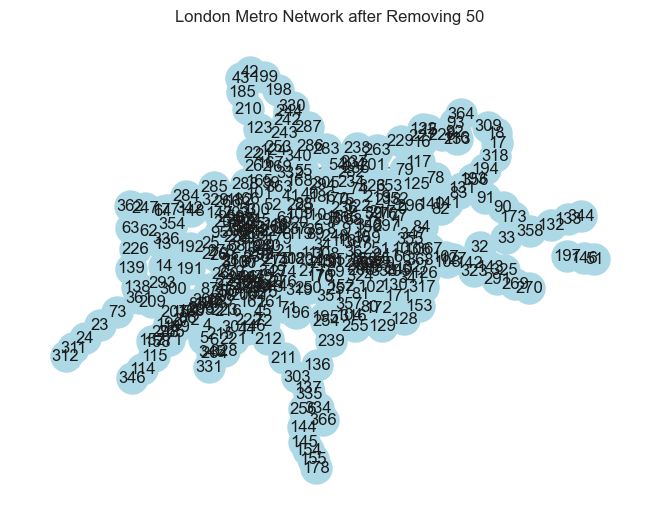

In [27]:
import networkx as nx
import matplotlib.pyplot as plt

def remove_node_and_analyze(G, node_to_remove):
    """
    G: Original network graph
    node_to_remove: Node to be removed for disruption analysis
    """
    G_copy = G.copy()
    G_copy.remove_node(node_to_remove)

    # Ensure finite capacities
    for u, v, data in G_copy.edges(data=True):
        if 'capacity' not in data or not isinstance(data['capacity'], (int, float)):
            data['capacity'] = data.get('weight', 1)
        elif data['capacity'] == float('inf'):
            data['capacity'] = 1

    # Analyze the impact by checking connectivity, flow, etc.
    largest_cc = max(nx.connected_components(G_copy), key=len)
    num_connected_components = nx.number_connected_components(G_copy)

    source_node = 0  # Replace with actual source node ID
    sink_node = max(G.nodes)  # Replace with actual sink node ID
    
    if nx.has_path(G_copy, source_node, sink_node):
        try:
            flow = nx.maximum_flow_value(G_copy, source_node, sink_node, capacity='capacity')
        except nx.NetworkXError:
            flow = 'undefined'
    else:
        flow = 'undefined'
    
    print(f"After removing {node_to_remove}:")
    print(f"  - Largest connected component size: {len(largest_cc)}")
    print(f"  - Number of connected components: {num_connected_components}")
    print(f"  - Maximum Flow: {flow}")
    
    return G_copy

critical_station = 50
G_disrupted = remove_node_and_analyze(G, critical_station)

# Plot the disrupted network
pos = nx.spring_layout(G_disrupted)
nx.draw(G_disrupted, pos, with_labels=True, node_size=500, node_color='lightblue')
plt.title(f'London Metro Network after Removing {critical_station}')
plt.show()


#### Percolation Theory & Flow-Based Network Analysis

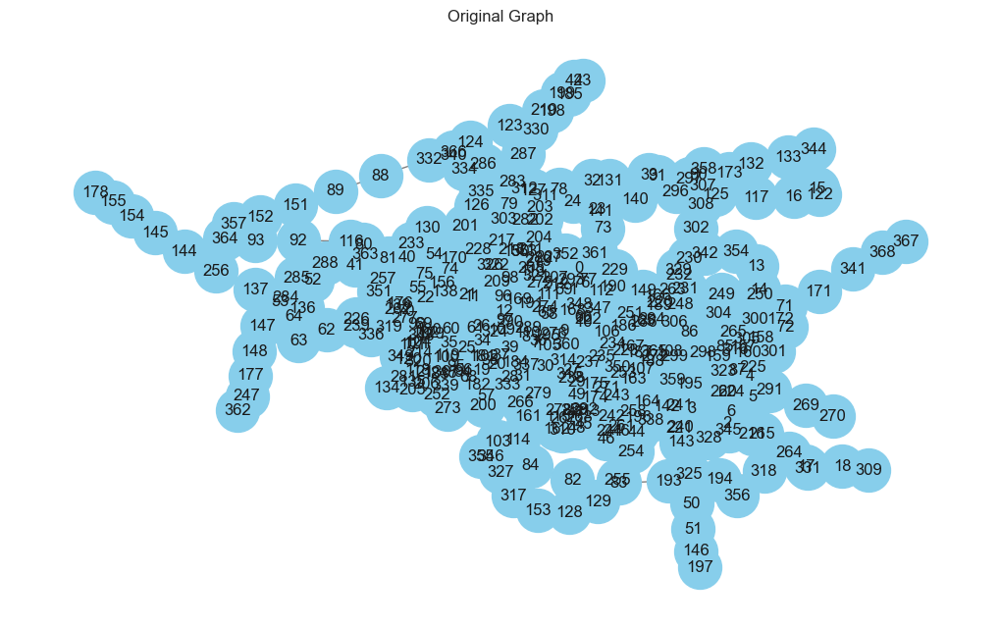

Initial Maximum Flow from 84 to 40: 1


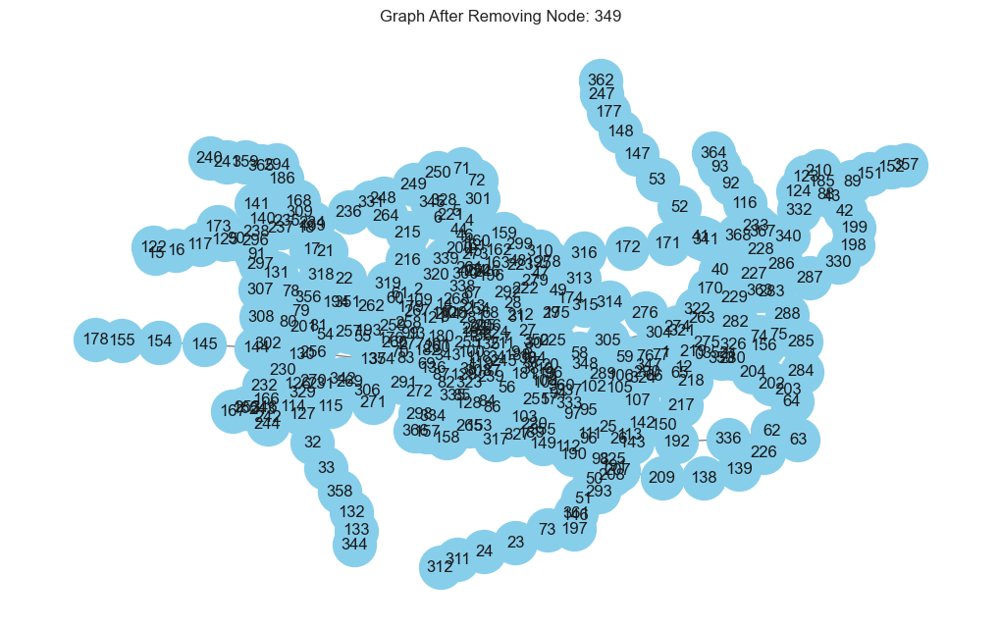

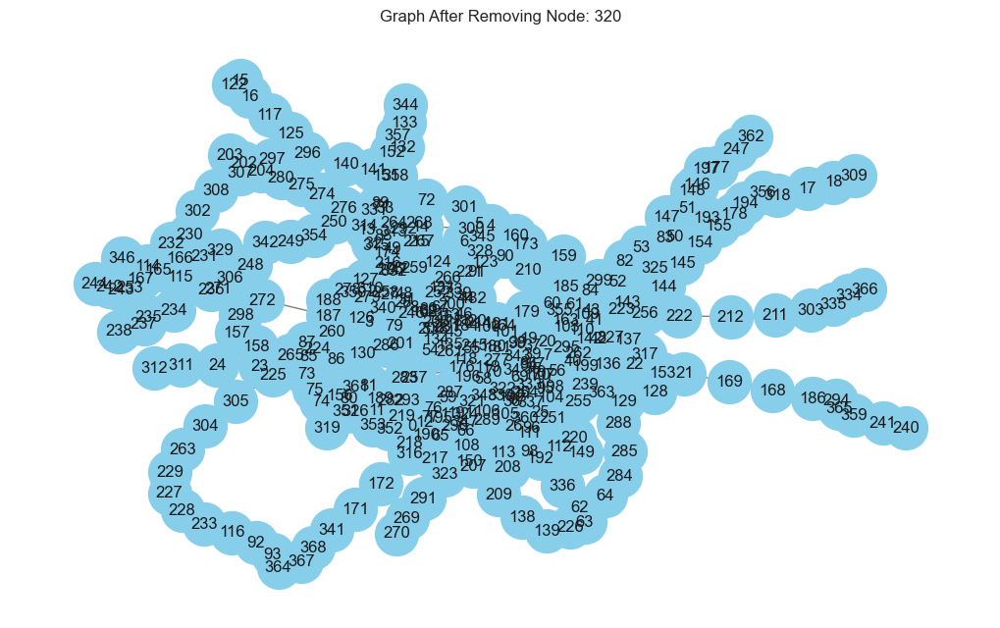

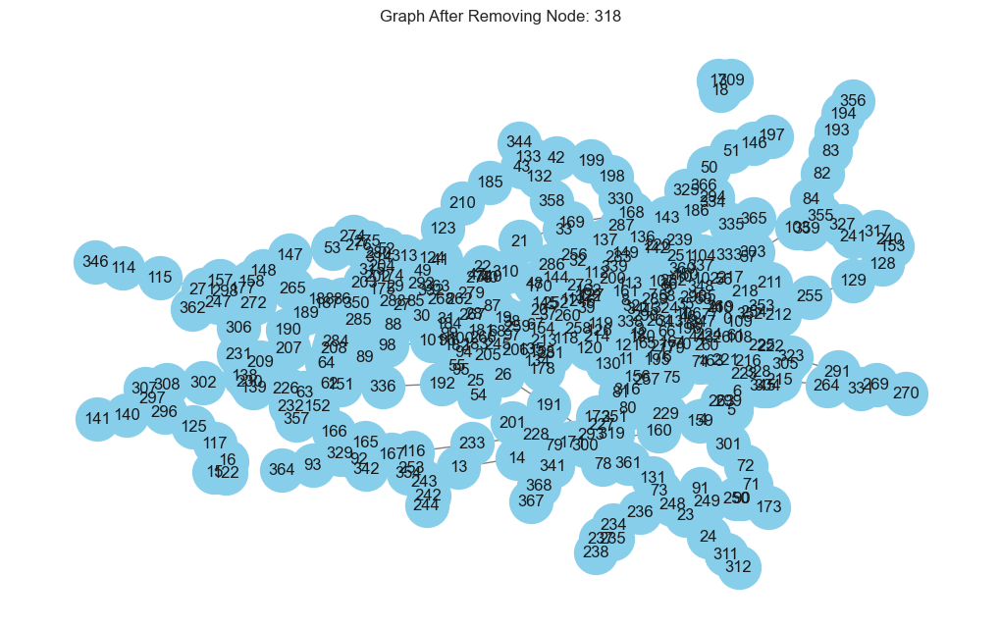

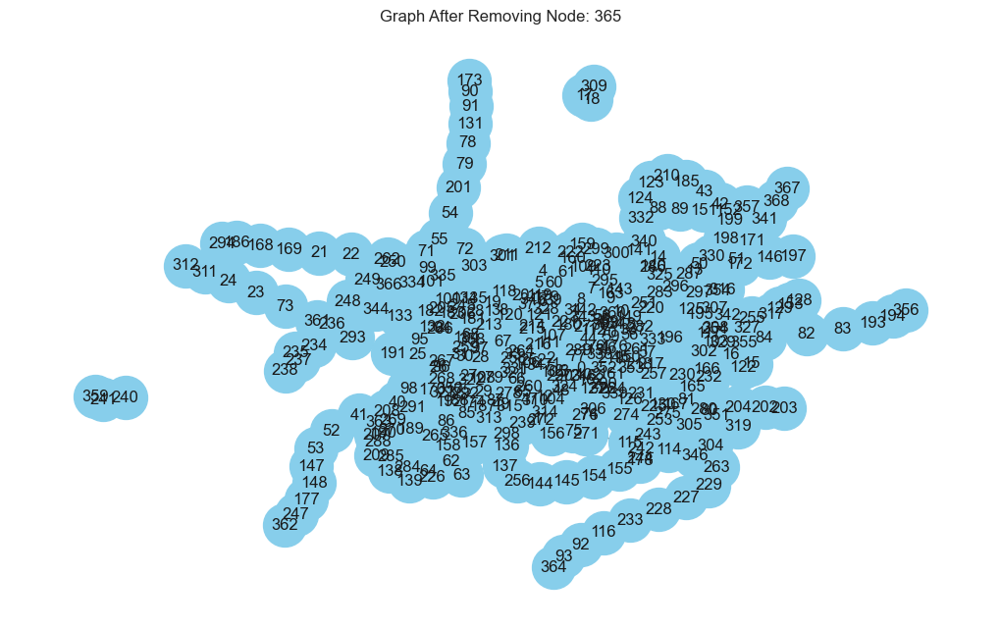

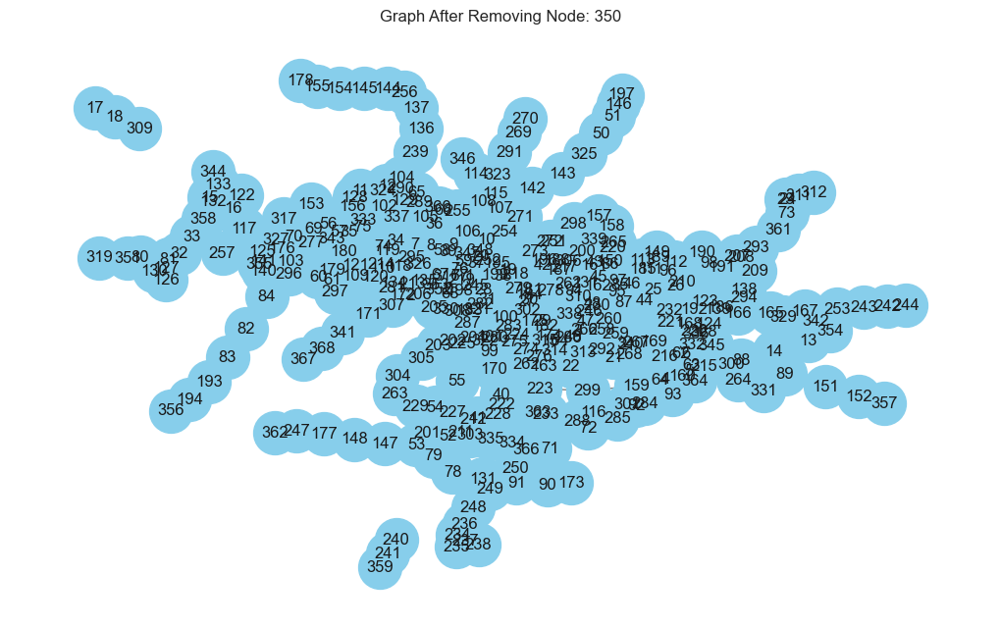

...

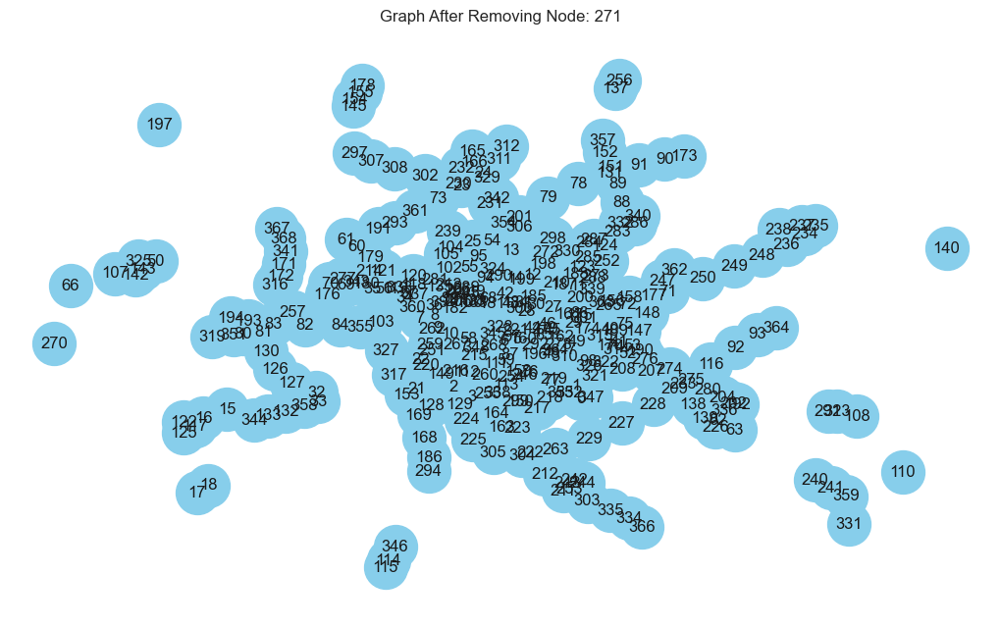

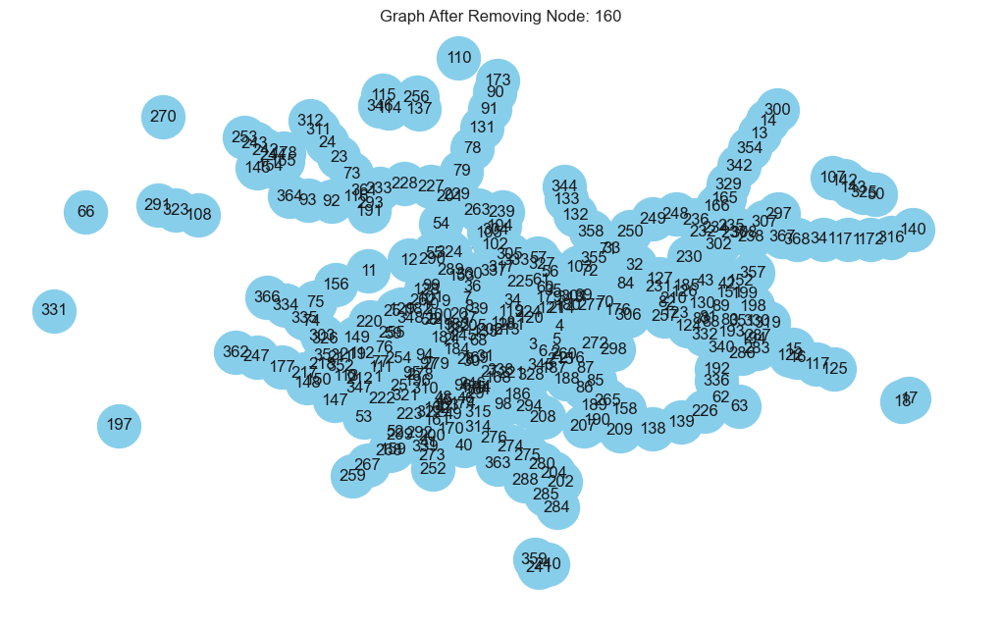

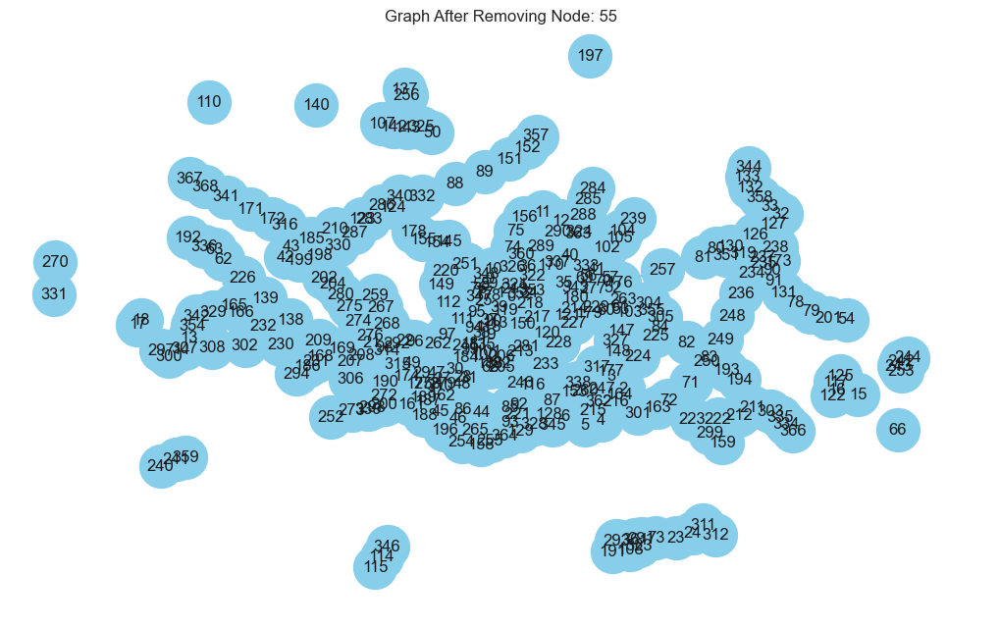

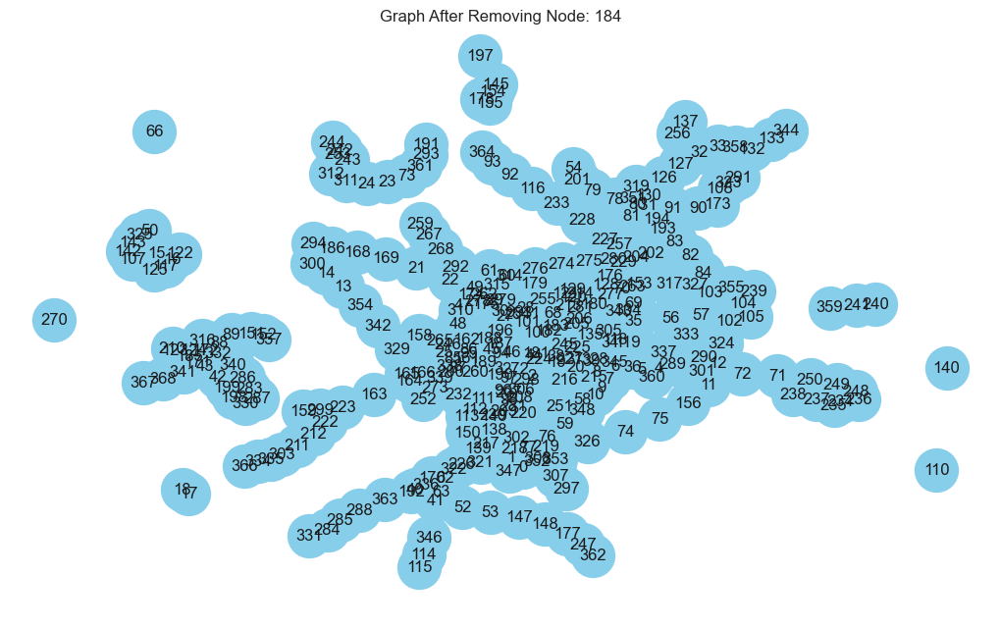

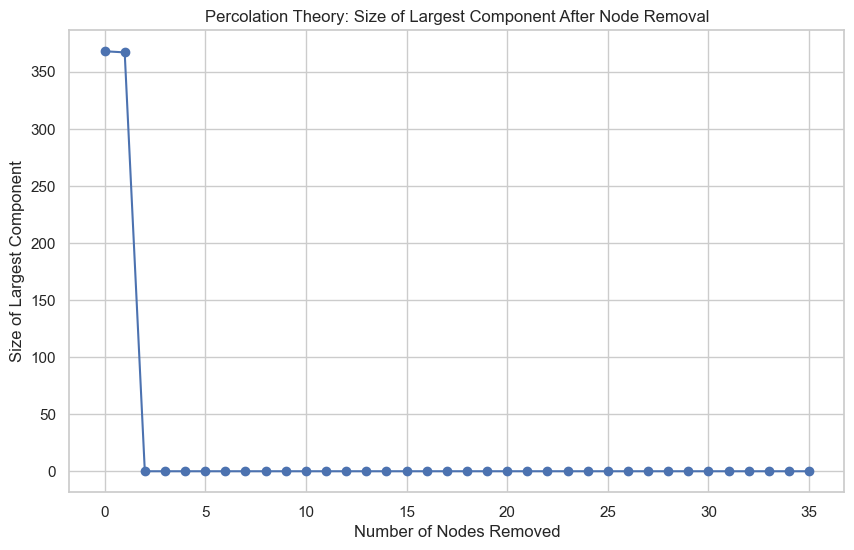

Maximum Flow from 84 to 40 After Disruption: 1
Flow Reduction: 0


In [30]:
from networkx.algorithms.flow import maximum_flow
from collections import defaultdict
import random

# plot graph components
def plot_graph(graph, title="Graph"):
    pos = nx.spring_layout(graph)
    plt.figure(figsize=(10, 6))
    nx.draw(graph, pos, with_labels=True, node_color='skyblue', edge_color='gray', node_size=1000, font_size=12)
    plt.title(title)
    plt.show()

### Percolation Theory: Node Removal and Largest Component Analysis 
def percolation_theory_node_removal(graph, node_list, plot=True):
    """
    Simulates the random removal of nodes and tracks the size of the largest component after each removal.
    """
    sizes_of_largest_component = []
    remaining_graph = graph.copy()
    
    for node in node_list:
        if node in remaining_graph:  # Ensure node exists before removing
            # Remove a node and compute the largest component
            remaining_graph.remove_node(node)
            if nx.is_connected(remaining_graph):
                largest_component = max(nx.connected_components(remaining_graph), key=len)
                sizes_of_largest_component.append(len(largest_component))
            else:
                sizes_of_largest_component.append(0) 
            
            if plot:
                plot_graph(remaining_graph, title=f"Graph After Removing Node: {node}")
    
    return sizes_of_largest_component


### Flow-Based Analysis: Maximum Flow between Key Stations
def calculate_max_flow(graph, source, target):
    """
    Calculates the maximum flow between two nodes (source, target) in the network.
    If edges have no 'capacity' attribute, assign a default capacity of 1.
    """
    # Add default capacity to each edge if no capacity is provided
    G_with_capacity = graph.copy()
    
    # Ensure finite capacities
    for u, v, data in G_with_capacity.edges(data=True):
        if 'capacity' not in data or not isinstance(data['capacity'], (int, float)):
            data['capacity'] = data.get('weight', 1)
        elif data['capacity'] == float('inf'):
            data['capacity'] = 1
    
    # Now calculate the max flow
    flow_value, _ = maximum_flow(G_with_capacity, source, target, capacity='capacity')
    return flow_value


plot_graph(G, title="Original Graph")

# Ensure source and target nodes are not removed
while True:
    source = random.choice(list(G.nodes))
    target = random.choice(list(G.nodes))
    if source != target:
        break

# Perform initial maximum flow analysis
initial_max_flow = calculate_max_flow(G, source, target)
print(f"Initial Maximum Flow from {source} to {target}: {initial_max_flow}")

# Simulate Node Disruption for Percolation Theory
# Simulate Node Disruption for Percolation Theory
nodes_to_remove = random.sample(
    [node for node in G.nodes if node not in {source, target}], 
    int(0.1 * G.number_of_nodes())
)
sizes_of_largest_component = percolation_theory_node_removal(G, nodes_to_remove)

# Plot the size of the largest component after each node removal
plt.figure(figsize=(10, 6))
plt.plot(sizes_of_largest_component, marker='o')
plt.title("Percolation Theory: Size of Largest Component After Node Removal")
plt.xlabel("Number of Nodes Removed")
plt.ylabel("Size of Largest Component")
plt.grid(True)
plt.show()

# Calculate Maximum Flow after node removal
G_disrupted = G.copy()
G_disrupted.remove_nodes_from(nodes_to_remove)

# Recalculate flow after disruptions
max_flow_after_disruption = calculate_max_flow(G_disrupted, source, target)
print(f"Maximum Flow from {source} to {target} After Disruption: {max_flow_after_disruption}")

# Compare and visualize the impact on flow
flow_difference = initial_max_flow - max_flow_after_disruption
print(f"Flow Reduction: {flow_difference}")


#### Shortest Path Algorithm 

In [31]:
# Function to calculate the shortest path length in the disrupted network
def shortest_path_analysis(graph, source_node, target_node):
    try:
        # Calculate shortest path using Dijkstra’s algorithm (handles weighted graphs)
        shortest_path = nx.dijkstra_path_length(graph, source=source_node, target=target_node, weight='weight')
        return shortest_path
    except nx.NetworkXNoPath:
        return float('inf')  
    
# Calculate shortest path before and after disruptions
normal_shortest_path = shortest_path_analysis(G, 1, 321)
disrupted_shortest_path = shortest_path_analysis(G_disrupted, 1, 321)

print(f"Shortest Path Before Disruption: {normal_shortest_path}")
print(f"Shortest Path After Disruption: {disrupted_shortest_path}")


Shortest Path Before Disruption: 2
Shortest Path After Disruption: 2


#### Spectral Graph Theory

In [32]:
# Function to calculate eigenvalues of the Laplacian matrix for spectral analysis
def spectral_analysis(graph):
    # Compute Laplacian matrix
    laplacian_matrix = nx.laplacian_matrix(graph).toarray()
    # Calculate eigenvalues
    eigenvalues = np.linalg.eigvals(laplacian_matrix)
    return np.sort(eigenvalues)

# Example usage: Spectral analysis for normal and disrupted graph
normal_eigenvalues = spectral_analysis(G)
disrupted_eigenvalues = spectral_analysis(G_disrupted)

print("Eigenvalues before disruption:", normal_eigenvalues)
print("Eigenvalues after disruption:", disrupted_eigenvalues)


Eigenvalues before disruption: [-2.64654114e-15  7.97526876e-03  1.09210236e-02  1.28894120e-02
  1.38210061e-02  1.49112590e-02  1.79190294e-02  1.85456009e-02
  2.00091749e-02  2.19313326e-02  2.42210630e-02  2.51463049e-02
  2.70753406e-02  3.00764334e-02  3.23348943e-02  3.67594377e-02
  4.75887905e-02  5.55878419e-02  6.18320236e-02  6.79923345e-02
  7.10441415e-02  7.23072469e-02  9.06669111e-02  9.91467436e-02
  1.06319270e-01  1.22485277e-01  1.35748684e-01  1.39336861e-01
  1.44558408e-01  1.52119813e-01  1.61752863e-01  1.65378860e-01
  1.76602182e-01  1.82709185e-01  1.88052705e-01  1.91814408e-01
  2.00422462e-01  2.15262355e-01  2.17996783e-01  2.25449959e-01
  2.29465861e-01  2.34207662e-01  2.48067318e-01  2.51708223e-01
  2.57056935e-01  2.66786648e-01  2.84838926e-01  2.89222203e-01
  3.06673214e-01  3.17276297e-01  3.18637822e-01  3.25577177e-01
  3.32014766e-01  3.49119837e-01  3.62276148e-01  3.69902912e-01
  3.78338593e-01  3.84490542e-01  3.97428597e-01  4.1218248

#### Network Flow Resilience

In [33]:
# Function to calculate maximum flow between two nodes
def network_flow_resilience(graph, source_node, target_node):
    try:
        # Calculate the maximum flow using the Edmonds-Karp algorithm (based on BFS)
        flow_value, flow_dict = nx.maximum_flow(graph, _s=source_node, _t=target_node, capacity='weight')
        return flow_value
    except nx.NetworkXUnbounded:
        return float('inf')  # Infinite flow, usually an error in network design

# Network flow before and after disruptions
normal_flow = network_flow_resilience(G, 1, 321)
disrupted_flow = network_flow_resilience(G_disrupted, 1, 321)

print(f"Maximum Flow Before Disruption: {normal_flow}")
print(f"Maximum Flow After Disruption: {disrupted_flow}")


Maximum Flow Before Disruption: 3
Maximum Flow After Disruption: 2


#### Robustness Index Calculation

Robustness Index after removing 20 nodes: 0.8373983739837398


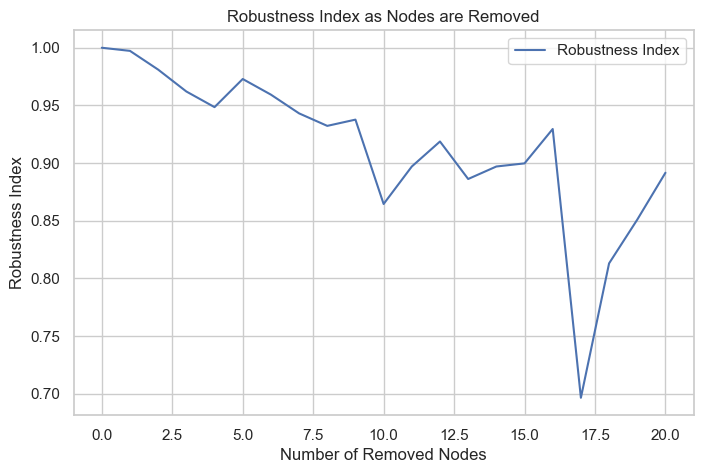

In [34]:
# Function to calculate network robustness index
def robustness_index(graph, num_removed_nodes):
    G = graph.copy()
    total_nodes = len(G.nodes)
    total_edges = len(G.edges)
    largest_connected_component_size = len(max(nx.connected_components(G), key=len))
    
    # Remove nodes and calculate the new largest component
    for _ in range(num_removed_nodes):
        node_to_remove = np.random.choice(list(G.nodes))  # Randomly remove a node
        G.remove_node(node_to_remove)
        if len(G.nodes) == 0: break  # Stop if the graph becomes empty
    
    # Size of the largest connected component after removals
    new_largest_connected_component_size = len(max(nx.connected_components(G), key=len))
    
    # Calculate the robustness index as the ratio of the largest component before and after
    robustness = new_largest_connected_component_size / largest_connected_component_size
    return robustness

num_removed_nodes = 20
robustness_before = robustness_index(G, num_removed_nodes)

print(f"Robustness Index after removing {num_removed_nodes} nodes: {robustness_before}")

# Visualization of robustness index calculation
plt.figure(figsize=(8, 5))
node_counts = list(range(0, num_removed_nodes + 1))
robustness_values = [robustness_index(G, i) for i in node_counts]
plt.plot(node_counts, robustness_values, label='Robustness Index')
plt.xlabel('Number of Removed Nodes')
plt.ylabel('Robustness Index')
plt.title('Robustness Index as Nodes are Removed')
plt.legend()
plt.show()


#### Community Detection Algorithm

In [35]:
pip install python-louvain

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for python-louvain: filename=python_louvain-0.16-py3-none-any.whl size=9419 sha256=fc9ba1db6babe72a87a3826bf0108a6fd0bc6e45c5893e8eb19d19938a266bab
  Stored in directory: c:\users\umer\appdata\local\pip\cache\wheels\d0\b0\d7\6dd26c3817810fa379088eaeb755a01d9a2a411c37632079d1
Successfully built python-louvain
Note: you may need to restart the kernel to use updated packages.


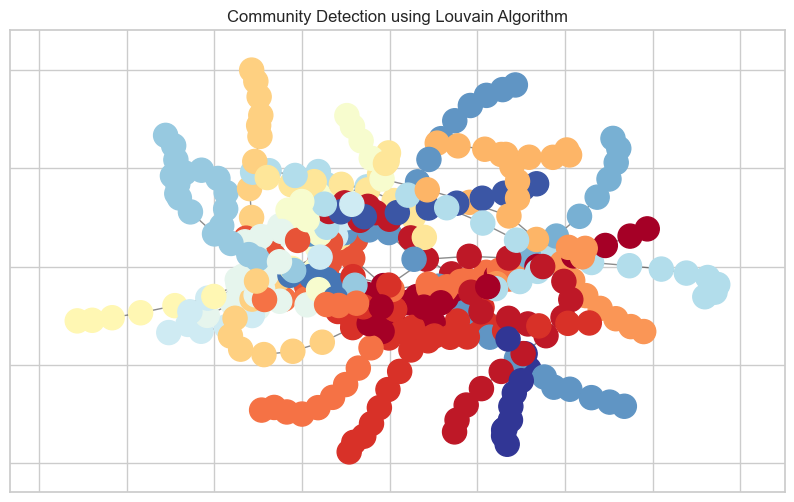

In [36]:
import community as community_louvain

# Function for community detection using Louvain's algorithm
def community_detection(graph):
    # Compute the best partition using Louvain's algorithm
    partition = community_louvain.best_partition(graph)
    return partition

# Community detection on the original graph
community_partition = community_detection(G)

# Visualize the communities
pos = nx.spring_layout(G)
plt.figure(figsize=(10, 6))
nx.draw_networkx_nodes(G, pos, community_partition.keys(), node_size=300, cmap=plt.cm.RdYlBu, node_color=list(community_partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.title('Community Detection using Louvain Algorithm')
plt.show()


#### Kendall Tau-Distance Calculation and Visualization

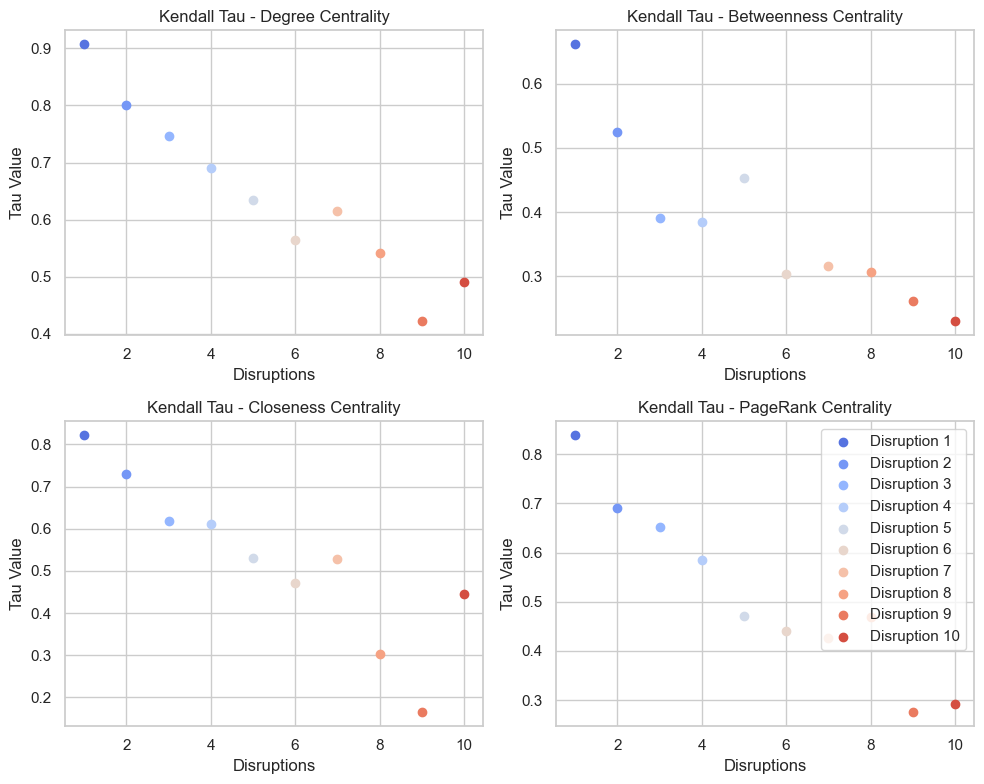

In [37]:
# Function to calculate Kendall tau numerically
def kendall_tau_distance(original_centrality, disrupted_centrality, common_nodes):
    # Extract centralities for only common nodes
    orig_centrality_filtered = [original_centrality[node] for node in common_nodes]
    disrupted_centrality_filtered = [disrupted_centrality[node] for node in common_nodes]
    tau, _ = kendalltau(orig_centrality_filtered, disrupted_centrality_filtered)
    return tau

# Function to calculate centrality measures
def calculate_centrality(graph):
    degree_centrality = nx.degree_centrality(graph)
    betweenness_centrality = nx.betweenness_centrality(graph)
    closeness_centrality = nx.closeness_centrality(graph)
    pagerank_centrality = nx.pagerank(graph)
    return degree_centrality, betweenness_centrality, closeness_centrality, pagerank_centrality

# Original graph centrality measures
degree_orig, betweenness_orig, closeness_orig, pagerank_orig = calculate_centrality(G)

# Simulate disruption by removing nodes and calculate disrupted graph centrality measures
def simulate_disruption(graph, num_nodes_to_remove):
    disrupted_graph = graph.copy()
    nodes_to_remove = np.random.choice(list(graph.nodes()), size=num_nodes_to_remove, replace=False)
    disrupted_graph.remove_nodes_from(nodes_to_remove)
    return disrupted_graph, calculate_centrality(disrupted_graph)

# Visualize Kendall Tau results for centrality measures
def visualize_kendall_tau(graph, num_disruptions=4, max_nodes_remove=5):
    # Prepare subplots
    fig, axs = plt.subplots(2, 2, figsize=(10, 8))
    centrality_measures = ['Degree Centrality', 'Betweenness Centrality', 'Closeness Centrality', 'PageRank Centrality']
    axs = axs.flatten()

    # Get original graph nodes and centralities
    orig_nodes = set(graph.nodes())
    
    for disruption_num in range(1, num_disruptions + 1):
        nodes_to_remove = disruption_num * max_nodes_remove  # Removing more nodes with each disruption
        disrupted_graph, (degree_disrupted, betweenness_disrupted, closeness_disrupted, pagerank_disrupted) = simulate_disruption(graph, nodes_to_remove)
        
        # Find common nodes between original and disrupted graph
        disrupted_nodes = set(disrupted_graph.nodes())
        common_nodes = list(orig_nodes.intersection(disrupted_nodes))

        # Calculate Kendall Tau for each centrality measure
        tau_degree = kendall_tau_distance(degree_orig, degree_disrupted, common_nodes)
        tau_betweenness = kendall_tau_distance(betweenness_orig, betweenness_disrupted, common_nodes)
        tau_closeness = kendall_tau_distance(closeness_orig, closeness_disrupted, common_nodes)
        tau_pagerank = kendall_tau_distance(pagerank_orig, pagerank_disrupted, common_nodes)

        kendall_tau_values = [tau_degree, tau_betweenness, tau_closeness, tau_pagerank]
        
        # Plot results for this disruption
        for idx, ax in enumerate(axs):
            ax.scatter(disruption_num, kendall_tau_values[idx], label=f'Disruption {disruption_num}', color=sns.color_palette("coolwarm", num_disruptions)[disruption_num-1])
            ax.set_title(f"Kendall Tau - {centrality_measures[idx]}")
            ax.set_xlabel("Disruptions")
            ax.set_ylabel("Tau Value")
            ax.grid(True)

    plt.tight_layout()
    plt.legend()
    plt.show()

# Run the visualization for Kendall Tau comparison
visualize_kendall_tau(G, num_disruptions=10, max_nodes_remove=15)


#### Dataset Creation

In [39]:
# Calculate node degree
node_degree = edges.groupby('source').size().reset_index(name='degree')

# Calculate average edge weight per node
avg_edge_weight = edges.groupby('source')['weight'].mean().reset_index(name='avg_weight')

# Merge with nodes dataset
nodes = pd.merge(nodes, node_degree, left_on='nodeID', right_on='source', how='left').fillna(0)
nodes = pd.merge(nodes, avg_edge_weight, left_on='nodeID', right_on='source', how='left').fillna(0)

# Save updated dataset
nodes.to_csv('nodes_augmented.csv', index=False)


In [42]:
# Create a graph for each layer
for layer_id in edges['layer'].unique():
    layer_edges = edges[edges['layer'] == layer_id]
    G = nx.Graph()
    G.add_weighted_edges_from(layer_edges[['source', 'target', 'weight']].values)

    # Calculate shortest path lengths
    shortest_paths = dict(nx.all_pairs_dijkstra_path_length(G))
    # Convert to a flat format
    paths = [
        {'source': src, 'target': tgt, 'distance': dist}
        for src, paths in shortest_paths.items()
        for tgt, dist in paths.items()
    ]
    pd.DataFrame(paths).to_csv(f'shortest_paths_layer_{layer_id}.csv', index=False)


In [43]:
# Count layers each node is part of
inter_layer_connections = edges.groupby(['source', 'target']).agg(
    layers_connected=('layer', 'nunique')
).reset_index()

# Save inter-layer connections
inter_layer_connections.to_csv('inter_layer_connections.csv', index=False)


In [44]:
combined_data = nodes.merge(edges, left_on='nodeID', right_on='source', how='left')
combined_data = combined_data.merge(layers_df, left_on='layer', right_on='layerID', how='left')

# Save combined dataset
combined_data.to_csv('combined_dataset.csv', index=False)


#### Physics-Informed Neural Network (Adjoint Sensitivity Analysis)

In [10]:
import tensorflow as tf
import tensorflow_probability as tfp
from tensorflow.keras import layers, Model
import plotly.graph_objects as go
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_squared_log_error

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [8]:
# Adjoint Sensitivity Analysis which comes from  a Physics-Informed Neural Network based on perturbations theory 
# to predict disruptions on the TFL multiplex 


# Load combined data
combined_data = pd.read_csv('combined_dataset.csv')
combined_data.interpolate(method='linear', inplace=True)

combined_data.head()

C:\Users\Umer\AppData\Local\Temp\ipykernel_6308\3098176221.py:7: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  combined_data.interpolate(method='linear', inplace=True)


,nodeID,nodeLabel,nodeLat,nodeLong,source_x,degree,source_y,avg_weight,layer,source,target,weight,layerID,layerLabel
0,0,abbeyroad,51.531952,0.003738,0.0,2.0,0.0,1.0,3.0,0.0,1.0,1.0,3.0,DLR
1,0,abbeyroad,51.531952,0.003738,0.0,2.0,0.0,1.0,3.0,0.0,352.0,1.0,3.0,DLR
2,1,westham,51.528526,0.005332,1.0,5.0,1.0,1.4,1.0,1.0,77.0,2.0,1.0,Tube
3,1,westham,51.528526,0.005332,1.0,5.0,1.0,1.4,1.0,1.0,106.0,1.0,1.0,Tube
4,1,westham,51.528526,0.005332,1.0,5.0,1.0,1.4,1.0,1.0,219.0,1.0,1.0,Tube


In [10]:
# Define input features (X) and target variable (Y)
X = combined_data[['nodeID', 'degree', 'avg_weight', 'layerID', 'source', 'target', 'nodeLat', 'nodeLong']]  
Y = combined_data['weight']  # Using edge weight as the target variable

In [11]:
# Split the data into training, development, and test sets
X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, test_size=0.3, random_state=42)
X_dev, X_test, Y_dev, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=42)

# Normalize the data 
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_dev = scaler.transform(X_dev)
X_test = scaler.transform(X_test)

In [12]:
# Define the PINN model
def create_pinn_model(input_dim):
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(shape=(input_dim,)),
        tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(32, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        tf.keras.layers.Dense(1)  # Output layer (regression)
    ])
    return model

# Create the model
input_dim = X_train.shape[1]
model = create_pinn_model(input_dim)
model.compile(optimizer='adam', loss='mean_squared_error')


In [13]:
# Custom loss function to incorporate Physics-Informed Adjoint Sensitivity
@tf.function(reduce_retracing=True)
def custom_loss(y_true, y_pred):
    # Basic loss (mean squared error)
    loss = tf.reduce_mean(tf.square(y_true - y_pred))
    
    # Regularization term (L2 regularization is already added to layers)
    regularization_loss = tf.reduce_sum(model.losses)
    
    # Perturbation-based terms (example, can be extended with more physical equations)
    perturbation_loss = tf.reduce_mean(tf.abs(y_true - y_pred))  # Placeholder for perturbation term

    # Total loss
    total_loss = loss + regularization_loss + perturbation_loss
    return total_loss

# Compile the model with custom loss
model.compile(optimizer='adam', loss=custom_loss)


In [14]:
# Train the model
history = model.fit(X_train, Y_train, validation_data=(X_dev, Y_dev), epochs=100, batch_size=32)

# Save the model
model.save('pinn_model.h5')

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 4.7826 - val_loss: 4.8907
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3.5185 - val_loss: 4.6356
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 3.2569 - val_loss: 4.4779
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3.0937 - val_loss: 4.1609
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.9579 - val_loss: 3.9764
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.9042 - val_loss: 3.7433
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.7874 - val_loss: 3.5726
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.7349 - val_loss: 3.3543
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.7217 - val_loss: 3.1633
Epoch 10/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.6179 - val_loss: 2.9671
Epoch 11/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.5589 - val_loss: 2.8820
Epoch 12/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - los

Epoch 69/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6301 - val_loss: 0.6884
Epoch 70/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6133 - val_loss: 0.7089
Epoch 71/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6298 - val_loss: 0.6908
Epoch 72/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6244 - val_loss: 0.6918
Epoch 73/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.5929 - val_loss: 0.6500
Epoch 74/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5905 - val_loss: 0.6482
Epoch 75/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5651 - val_loss: 0.6341
Epoch 76/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5783 - val_loss: 0.6017
Epoch 77/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5660 - val_loss: 0.6287
Epoch 78/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5706 - val_loss: 0.5955
Epoch 79/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5312 - val_loss: 0.5985
Epoch 80/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 12

In [15]:
# Evaluate the model on the test set
test_loss = model.evaluate(X_test, Y_test)

# Predictions
Y_pred = model.predict(X_test)

# Calculate R-squared or other relevant metrics
from sklearn.metrics import mean_squared_error, r2_score

mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)
mae = mean_absolute_error(Y_test, Y_pred)
msle = mean_squared_log_error(Y_test, Y_pred)

print(f"Test Loss: {test_loss}")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")
print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Logarithmic Error: {msle}")


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3710
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Test Loss: 0.3612631559371948
Mean Squared Error: 0.03540085439233373
R-squared: 0.40371009657790136
Mean Absolute Error: 0.09063387973788684
Mean Squared Logarithmic Error: 0.006450994178988391


In [26]:
Y_test_np = np.array(Y_test).flatten()
Y_pred_np = Y_pred.flatten()

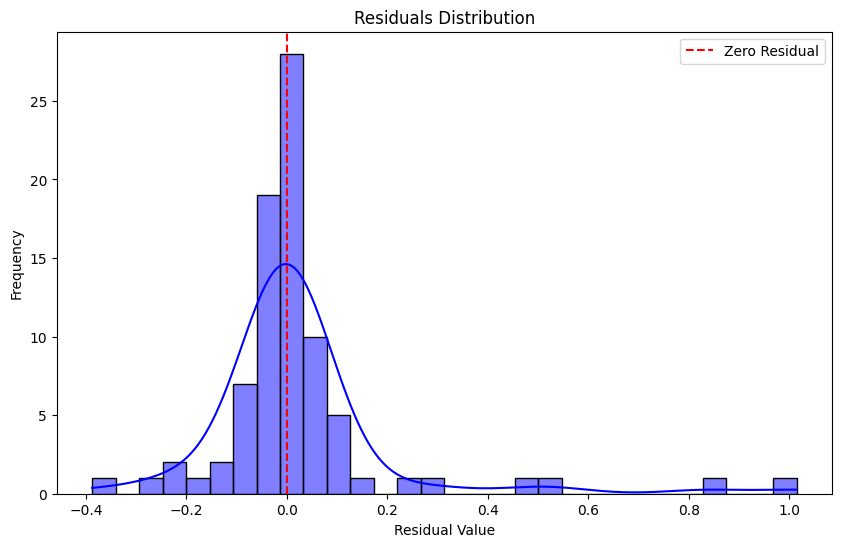

In [27]:
# Residuals Histogram 
plt.figure(figsize=(10, 6))
residuals = Y_test_np - Y_pred_np
sns.histplot(residuals, kde=True, bins=30, color="blue")
plt.title("Residuals Distribution")
plt.xlabel("Residual Value")
plt.ylabel("Frequency")
plt.axvline(x=0, color='red', linestyle='--', label="Zero Residual")
plt.legend()
plt.show()

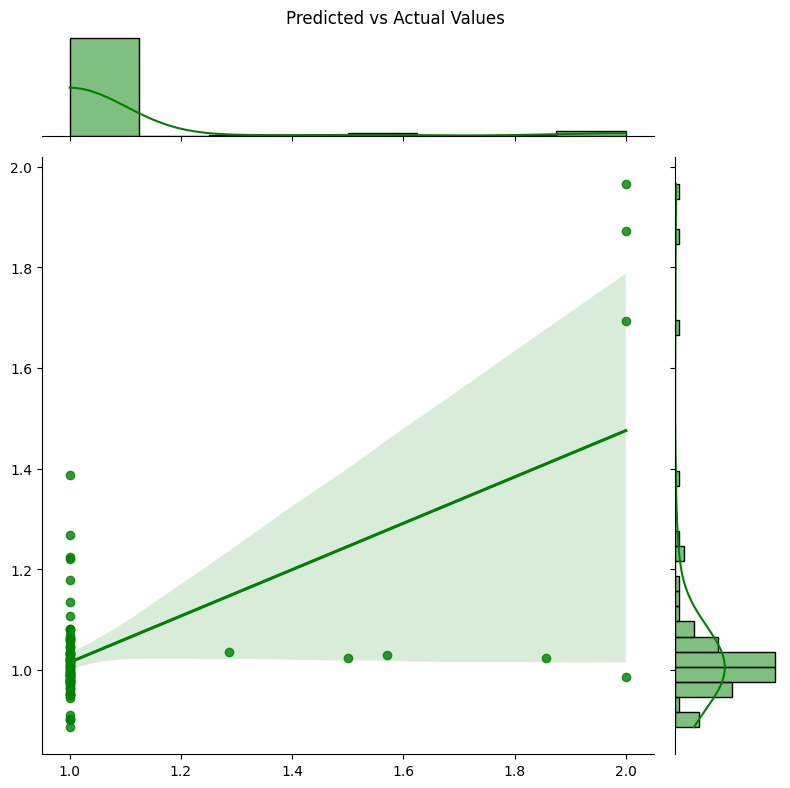

In [28]:
# Joint Plot of Predictions vs Actuals
sns.jointplot(x=Y_test_np, y=Y_pred_np, kind="reg", color="green", height=8)
plt.suptitle("Predicted vs Actual Values")
plt.subplots_adjust(top=0.95)
plt.show()

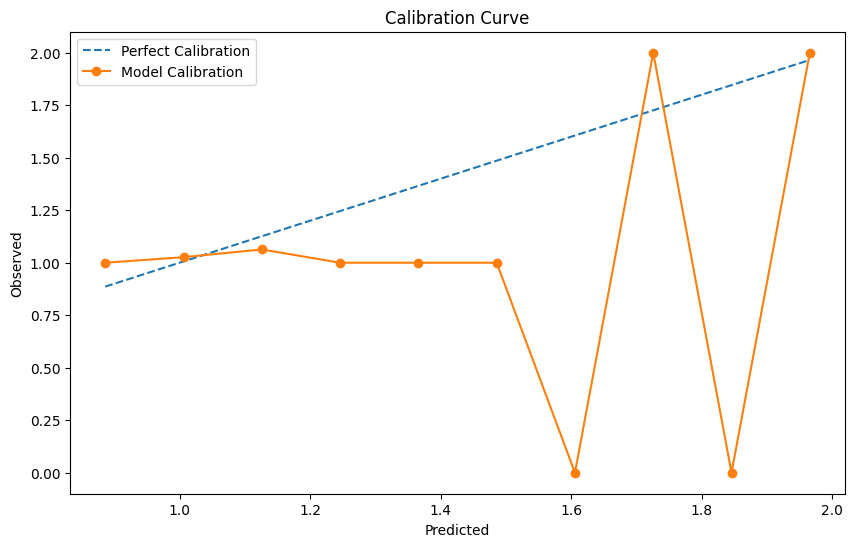

In [29]:
# 3. Calibration Curve 
# Binning the predicted probabilities for calibration
bin_means = np.linspace(min(Y_pred_np), max(Y_pred_np), 10)
bin_actuals = np.zeros(len(bin_means))
bin_counts = np.zeros(len(bin_means))

for i, pred in enumerate(Y_pred_np):
    for j, threshold in enumerate(bin_means):
        if pred <= threshold:
            bin_actuals[j] += Y_test_np[i]
            bin_counts[j] += 1
            break

bin_actuals = bin_actuals / np.maximum(bin_counts, 1)

plt.figure(figsize=(10, 6))
plt.plot(bin_means, bin_means, label="Perfect Calibration", linestyle="--")
plt.plot(bin_means, bin_actuals, marker="o", label="Model Calibration")
plt.title("Calibration Curve")
plt.xlabel("Predicted")
plt.ylabel("Observed")
plt.legend()
plt.show()

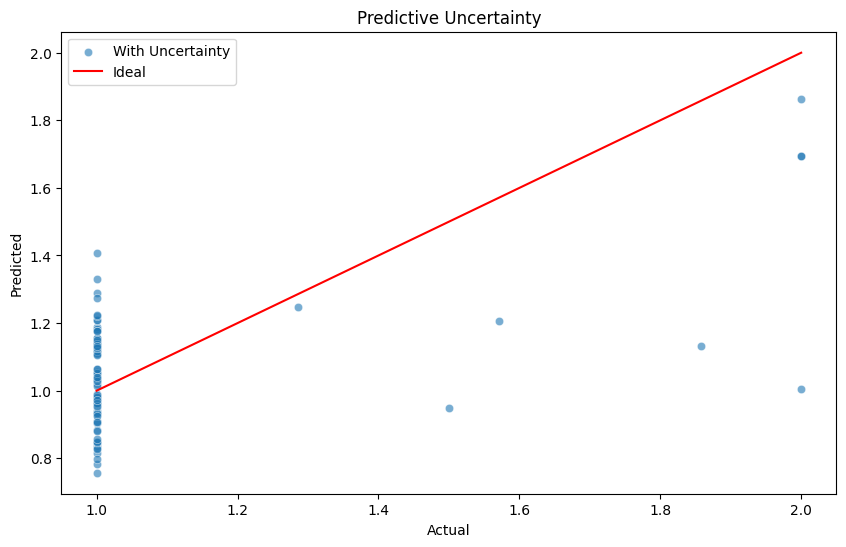

In [30]:
# Predictive Uncertainty 
# Adding noise to simulate uncertainty
noise_std = 0.1
Y_pred_uncertain = Y_pred_np + np.random.normal(0, noise_std, size=Y_pred_np.shape)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=Y_test_np, y=Y_pred_uncertain, label="With Uncertainty", alpha=0.6)
sns.lineplot(x=Y_test_np, y=Y_test_np, color="red", label="Ideal")
plt.title("Predictive Uncertainty")
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.legend()
plt.show()

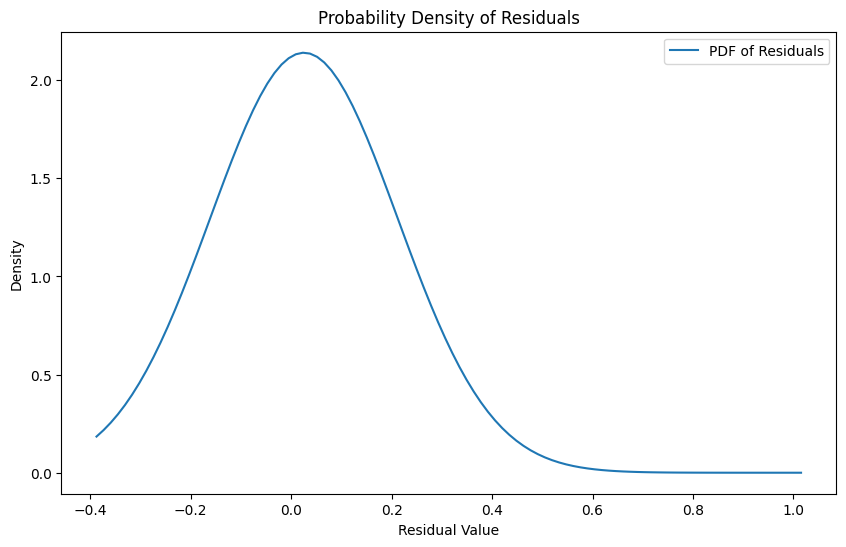

In [31]:
# Probability Density Estimation using TensorFlow Probability (Advanced)
tfp_distributions = tfp.distributions

# Fit a Gaussian distribution to residuals
residual_dist = tfp_distributions.Normal(loc=np.mean(residuals), scale=np.std(residuals))

x_vals = np.linspace(min(residuals), max(residuals), 100)
pdf_vals = residual_dist.prob(x_vals)

plt.figure(figsize=(10, 6))
plt.plot(x_vals, pdf_vals, label="PDF of Residuals")
plt.title("Probability Density of Residuals")
plt.xlabel("Residual Value")
plt.ylabel("Density")
plt.legend()
plt.show()

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
3/3 ━━━━━━━━

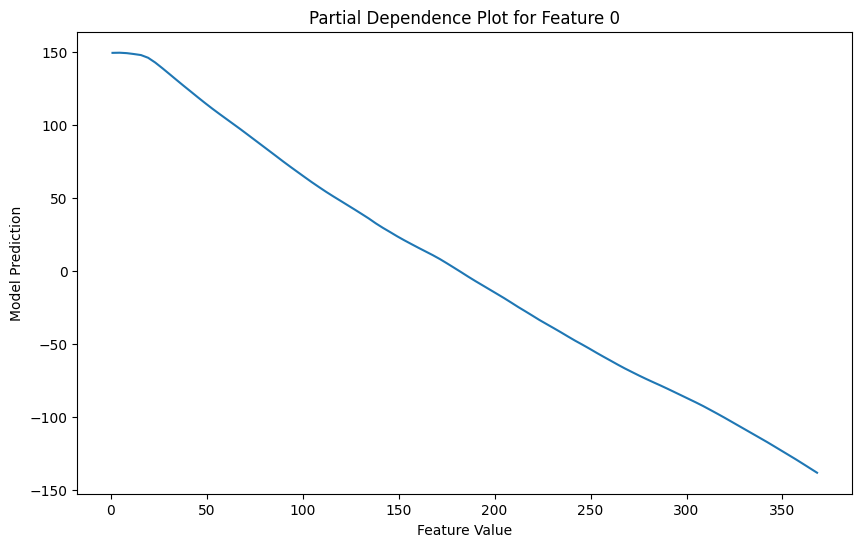

In [32]:
# Partial Dependence Plots (Advanced)
def partial_dependence(model, feature_index, X_sample, num_points=100):
    X_pd = np.array(X_sample)
    feature_vals = np.linspace(np.min(X_pd[:, feature_index]), np.max(X_pd[:, feature_index]), num_points)
    preds = []

    for val in feature_vals:
        X_pd[:, feature_index] = val
        preds.append(model.predict(X_pd).mean())

    return feature_vals, preds

# for the first feature
feature_idx = 0
feature_vals, partial_preds = partial_dependence(model, feature_idx, X_test)

plt.figure(figsize=(10, 6))
plt.plot(feature_vals, partial_preds)
plt.title(f"Partial Dependence Plot for Feature {feature_idx}")
plt.xlabel("Feature Value")
plt.ylabel("Model Prediction")
plt.show()

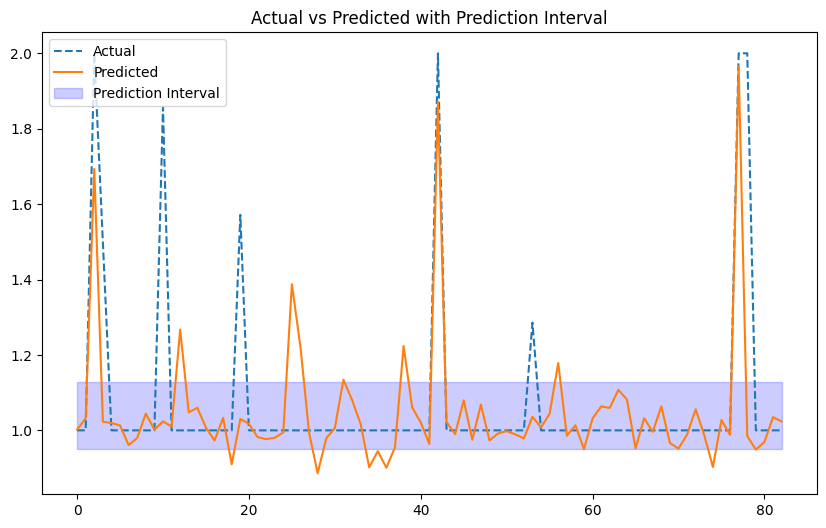

In [36]:
# Actual vs Predicted with Prediction Intervals
percentile_10 = np.percentile(Y_pred_np, 10)
percentile_90 = np.percentile(Y_pred_np, 90)

plt.figure(figsize=(10, 6))
plt.plot(Y_test_np, label="Actual", linestyle="--")
plt.plot(Y_pred_np, label="Predicted")
plt.fill_between(range(len(Y_pred_np)), percentile_10, percentile_90, color="blue", alpha=0.2, label="Prediction Interval")
plt.legend()
plt.title("Actual vs Predicted with Prediction Interval")
plt.show()

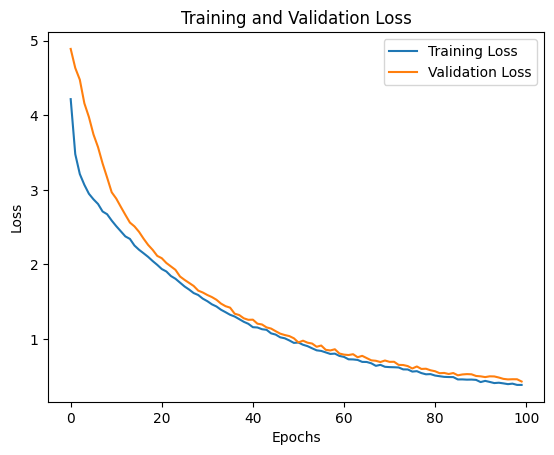

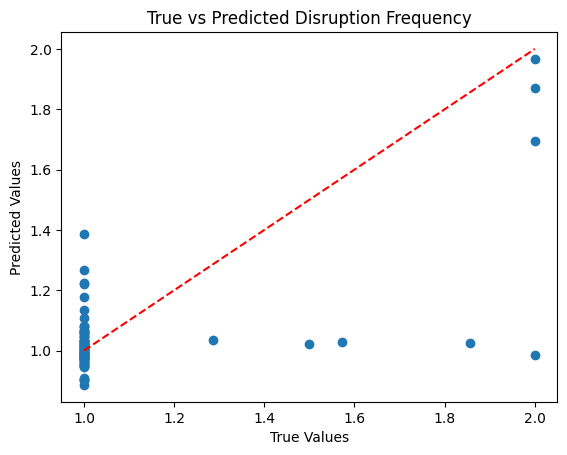

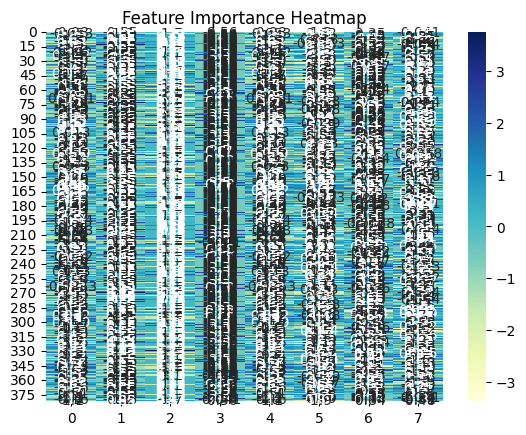

In [16]:
# Plot training/validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

# Plot predicted vs actual
plt.scatter(Y_test, Y_pred)
plt.plot([min(Y_test), max(Y_test)], [min(Y_test), max(Y_test)], color='red', linestyle='--')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('True vs Predicted Disruption Frequency')
plt.show()

# Feature importance heatmap (example, adapt as per data)
sns.heatmap(X_train, annot=True, cmap="YlGnBu")
plt.title('Feature Importance Heatmap')
plt.show()


#### Uncertainty Propagation Task

In [17]:
# Uncertainty Propagation Task  that predicts failure propagation paths
from tensorflow.keras import layers, models

# Load the combined dataset
combined_data = pd.read_csv('combined_dataset.csv')

# Preprocessing
# Normalize numerical columns
combined_data['degree'] = (combined_data['degree'] - combined_data['degree'].min()) / (combined_data['degree'].max() - combined_data['degree'].min())
combined_data['avg_weight'] = (combined_data['avg_weight'] - combined_data['avg_weight'].min()) / (combined_data['avg_weight'].max() - combined_data['avg_weight'].min())

combined_data.interpolate(method='linear', inplace=True)

C:\Users\Umer\AppData\Local\Temp\ipykernel_6308\2647387379.py:12: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  combined_data.interpolate(method='linear', inplace=True)


In [18]:
# Create features and target for training 
X = combined_data[['nodeID', 'degree', 'avg_weight', 'layerID', 'source', 'target', 'nodeLat', 'nodeLong']]  
y = combined_data['weight']

# Split the dataset into train, dev, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_dev, X_test, y_dev, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [19]:
# Model construction
model = models.Sequential()
model.add(layers.InputLayer(shape=(X_train.shape[1],)))  
model.add(layers.Dense(64, activation='relu', kernel_initializer='he_normal'))  
model.add(layers.BatchNormalization())  # Batch normalization
model.add(layers.Dense(32, activation='relu', kernel_initializer='he_normal'))
model.add(layers.BatchNormalization())  
model.add(layers.Dense(1))  # Predict failure propagation 

model.compile(optimizer='adam', loss='mse', metrics=['mae'])

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_dev, y_dev))

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 2.7148 - mae: 1.1965 - val_loss: 2.7220 - val_mae: 1.1386
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.6599 - mae: 1.0834 - val_loss: 2.1265 - val_mae: 0.9749
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.2231 - mae: 0.9667 - val_loss: 1.5250 - val_mae: 0.8703
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0162 - mae: 0.8644 - val_loss: 1.3033 - val_mae: 0.8698
Epoch 5/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7958 - mae: 0.7648 - val_loss: 1.3245 - val_mae: 0.8822
Epoch 6/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6734 - mae: 0.6877 - val_loss: 1.4142 - val_mae: 0.9767
Epoch 7/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6080 - mae: 0.6310 - val_loss: 1.0811 - val_mae: 0.7849
Epoch 8/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.5684 - mae: 0.5741 - val_loss: 1.1288 - val_mae: 0.8053
Epoch 9/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.37

Epoch 55/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1453 - mae: 0.2530 - val_loss: 0.2502 - val_mae: 0.3152
Epoch 56/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.1389 - mae: 0.2378 - val_loss: 0.2588 - val_mae: 0.3246
Epoch 57/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1512 - mae: 0.2536 - val_loss: 0.2437 - val_mae: 0.2984
Epoch 58/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1153 - mae: 0.2305 - val_loss: 0.2302 - val_mae: 0.2802
Epoch 59/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.1387 - mae: 0.2465 - val_loss: 0.2367 - val_mae: 0.2996
Epoch 60/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.1386 - mae: 0.2454 - val_loss: 0.2123 - val_mae: 0.2485
Epoch 61/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1404 - mae: 0.2505 - val_loss: 0.2214 - val_mae: 0.2930
Epoch 62/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.1518 - mae: 0.2561 - val_loss: 0.2240 - val_mae: 0.2844
Epoch 63/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/s

In [20]:
# Evaluate the model
loss, mae = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss}, Test MAE: {mae}")

# Predict the results
y_pred = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2070 - mae: 0.3513
Test Loss: 0.18968431651592255, Test MAE: 0.3383403420448303
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


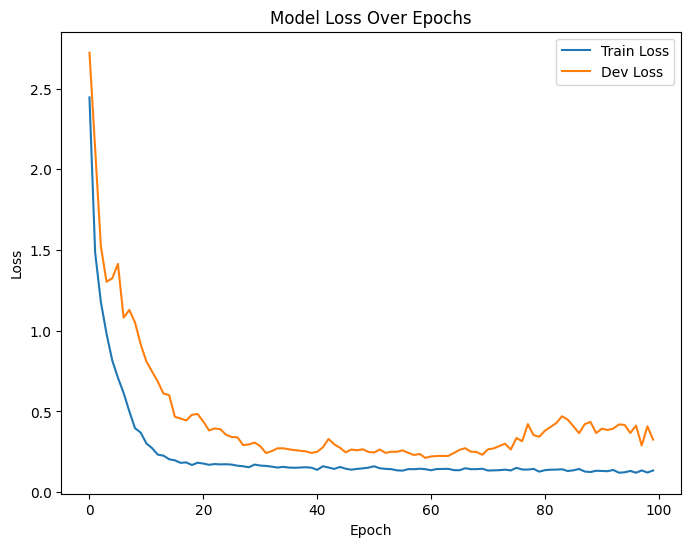

In [21]:
# Visualization
# 1. Loss curve during training
plt.figure(figsize=(8, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Dev Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Model Loss Over Epochs')
plt.legend()
plt.show()

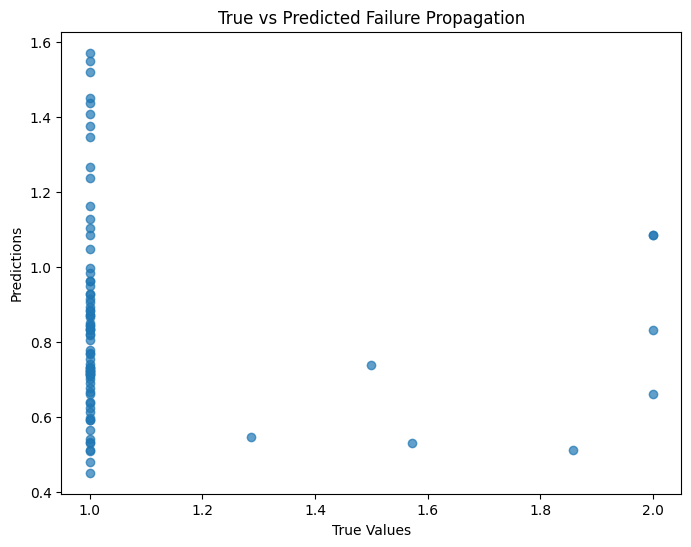

In [22]:
# 2. Scatter plot of true vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.title('True vs Predicted Failure Propagation')
plt.show()

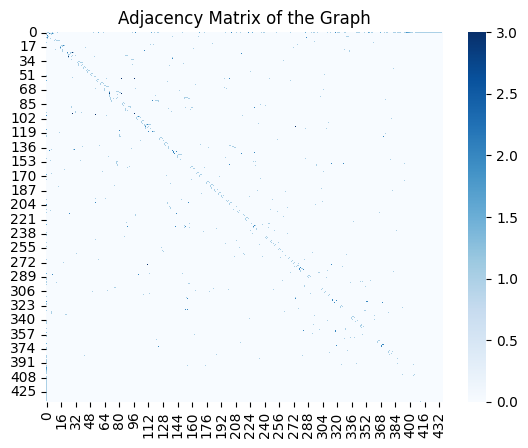

In [23]:
# 3. Heatmap of the adjacency matrix (representing the graph)
G = nx.Graph()
for idx, row in combined_data.iterrows():
    G.add_edge(row['source_x'], row['target'], weight=row['weight'])
adj_matrix = nx.to_numpy_array(G)
sns.heatmap(adj_matrix, cmap='Blues')
plt.title('Adjacency Matrix of the Graph')
plt.show()


#### Variational AutoEncoder (VAE) 

In [16]:
# Load and Preprocess the Data
nodes = pd.read_csv('nodes_augmented.csv')
edges = pd.read_csv('combined_dataset.csv')

In [17]:
# Normalize numeric data
def normalize_data(df, exclude_columns):
    numeric_data = df.select_dtypes(include=['float64', 'int64'])
    normalized_data = (numeric_data - numeric_data.mean()) / numeric_data.std()
    return pd.concat([df[exclude_columns], normalized_data], axis=1)

nodes_preprocessed = normalize_data(nodes, ['nodeID', 'nodeLabel'])
edges_preprocessed = normalize_data(edges, ['source', 'target', 'layerLabel'])

In [18]:
# Split data into train, dev, and test sets
X = nodes_preprocessed.drop(['nodeID', 'nodeLabel'], axis=1).values
X = (X - X.mean(axis=0)) / X.std(axis=0)
X_train, X_temp = train_test_split(X, test_size=0.3, random_state=42)
X_dev, X_test = train_test_split(X_temp, test_size=0.5, random_state=42)

input_dim = X.shape[1]

In [19]:
# Define the VAE Model
class VAE(tf.keras.Model):
    def __init__(self, input_dim, latent_dim, hidden_dim):
        super(VAE, self).__init__()
        self.encoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(shape=(input_dim,)),
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(latent_dim * 2)  
        ])
        self.decoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(shape=(latent_dim,)),
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(input_dim, activation='sigmoid')
        ])

    def sample(self, z_mean, z_log_var):
        eps = tf.random.normal(shape=z_mean.shape)
        return z_mean + tf.exp(0.5 * z_log_var) * eps

    def call(self, x):
        z_params = self.encoder(x)
        z_mean, z_log_var = tf.split(z_params, num_or_size_splits=2, axis=1)
        z = self.sample(z_mean, z_log_var)
        reconstructed = self.decoder(z)
        kl_loss = -0.5 * tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1)
        return reconstructed, kl_loss


In [20]:
# Initialize VAE
latent_dim = 2
hidden_dim = 128
vae = VAE(input_dim=input_dim, latent_dim=latent_dim, hidden_dim=hidden_dim)

# Define Loss and Optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
mse_loss = tf.keras.losses.MeanSquaredError()


In [21]:
@tf.function
def train_step(x):
    with tf.GradientTape() as tape:
        reconstructed, kl_loss = vae(x)
        reconstruction_loss = tf.reduce_mean(mse_loss(x, reconstructed))
        total_loss = reconstruction_loss + tf.reduce_mean(kl_loss)
    gradients = tape.gradient(total_loss, vae.trainable_variables)
    optimizer.apply_gradients(zip(gradients, vae.trainable_variables))
    return total_loss, reconstruction_loss, tf.reduce_mean(kl_loss)


In [22]:
# Training Loop
epochs = 100
batch_size = 256
train_losses, dev_losses = [], []

for epoch in range(epochs):
    epoch_train_loss = 0
    for batch in tf.data.Dataset.from_tensor_slices(X_train).batch(batch_size):
        total_loss, reconstruction_loss, kl_loss = train_step(batch)
        epoch_train_loss += total_loss
    train_losses.append(epoch_train_loss / len(X_train))

    # Evaluate on Dev Set
    reconstructed, kl_loss = vae(X_dev)
    reconstruction_loss = tf.reduce_mean(mse_loss(X_dev, reconstructed))
    dev_loss = reconstruction_loss + tf.reduce_mean(kl_loss)
    dev_losses.append(dev_loss)

    print(f"Epoch {epoch+1}/{epochs}, Train Loss: {epoch_train_loss.numpy():.4f}, Dev Loss: {dev_loss.numpy():.4f}")



Epoch 1/100, Train Loss: 2.5782, Dev Loss: 1.6510
Epoch 2/100, Train Loss: 2.4865, Dev Loss: 1.5960
Epoch 3/100, Train Loss: 2.4332, Dev Loss: 1.5438
Epoch 4/100, Train Loss: 2.4170, Dev Loss: 1.5319
Epoch 5/100, Train Loss: 2.3438, Dev Loss: 1.5176
Epoch 6/100, Train Loss: 2.3952, Dev Loss: 1.4889
Epoch 7/100, Train Loss: 2.3666, Dev Loss: 1.4772
Epoch 8/100, Train Loss: 2.3388, Dev Loss: 1.4549
Epoch 9/100, Train Loss: 2.3346, Dev Loss: 1.4605
Epoch 10/100, Train Loss: 2.3097, Dev Loss: 1.4377
Epoch 11/100, Train Loss: 2.2619, Dev Loss: 1.4378
Epoch 12/100, Train Loss: 2.2318, Dev Loss: 1.4195
Epoch 13/100, Train Loss: 2.2654, Dev Loss: 1.4060
Epoch 14/100, Train Loss: 2.1931, Dev Loss: 1.4066
Epoch 15/100, Train Loss: 2.1806, Dev Loss: 1.4082
Epoch 16/100, Train Loss: 2.1916, Dev Loss: 1.3997
Epoch 17/100, Train Loss: 2.1319, Dev Loss: 1.3995
Epoch 18/100, Train Loss: 2.1063, Dev Loss: 1.3857
Epoch 19/100, Train Loss: 2.1557, Dev Loss: 1.3722
Epoch 20/100, Train Loss: 2.0412, Dev Lo

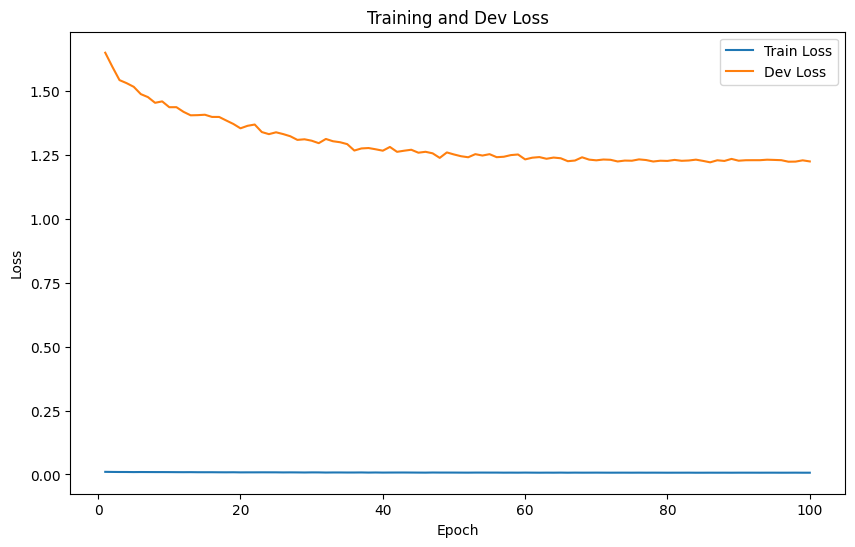

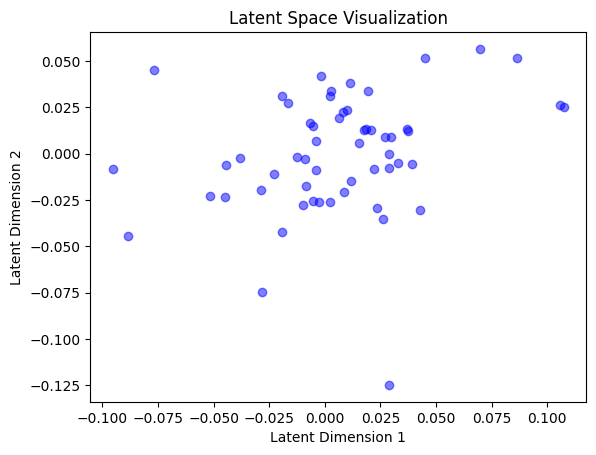

In [23]:
# Visualize Training and Dev Loss
plt.figure(figsize=(10, 6))
plt.plot(range(1, epochs + 1), train_losses, label='Train Loss')
plt.plot(range(1, epochs + 1), dev_losses, label='Dev Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Dev Loss')
plt.legend()
plt.show()

# Visualize Latent Space
z_mean, _ = tf.split(vae.encoder(X_test), num_or_size_splits=2, axis=1)
plt.scatter(z_mean[:, 0], z_mean[:, 1], c='blue', alpha=0.5)
plt.xlabel('Latent Dimension 1')
plt.ylabel('Latent Dimension 2')
plt.title('Latent Space Visualization')
plt.show()


#### Kl Divergence

KL Divergence: 0.0021464175079017878

Evaluation Metrics:
Accuracy: 0.7113
F1 Score: 0.4157
Precision: 0.3557
Recall: 0.5000

Label-wise Metrics:
Label-wise Precision: [0.71130952 0.        ]
Label-wise Recall: [1. 0.]

Confusion Matrix:
[[239   0]
 [ 97   0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83       239
           1       0.00      0.00      0.00        97

    accuracy                           0.71       336
   macro avg       0.36      0.50      0.42       336
weighted avg       0.51      0.71      0.59       336



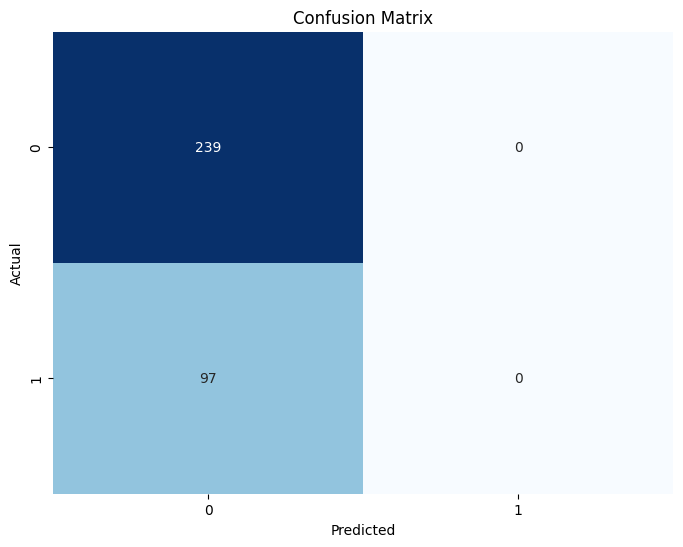

In [26]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf

# Function for KL divergence
def calculate_kl_divergence(z_mean, z_log_var):
    """
    Computes KL divergence for the given latent variables.
    """
    kl_divergence = -0.5 * tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1)
    return tf.reduce_mean(kl_divergence)

# Latent variables from the encoder
z_params = vae.encoder(X_test)
z_mean, z_log_var = tf.split(z_params, num_or_size_splits=2, axis=1)

# Calculate KL divergence
kl_divergence_value = calculate_kl_divergence(z_mean, z_log_var)
print(f"KL Divergence: {kl_divergence_value.numpy()}")

# Predict reconstructed values
reconstructed, _ = vae(X_test)

# Convert predictions and test data to binary
y_pred = (reconstructed.numpy() > 0.5).astype(int)
y_test_binary = (X_test > 0.5).astype(int)

# Calculate metrics with zero_division parameter to handle edge cases
accuracy = accuracy_score(y_test_binary.flatten(), y_pred.flatten())
f1 = f1_score(y_test_binary.flatten(), y_pred.flatten(), average='macro', zero_division=0)
precision = precision_score(y_test_binary.flatten(), y_pred.flatten(), average='macro', zero_division=0)
recall = recall_score(y_test_binary.flatten(), y_pred.flatten(), average='macro', zero_division=0)

print("\nEvaluation Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

# Label-wise metrics
label_wise_precision = precision_score(y_test_binary.flatten(), y_pred.flatten(), average=None, zero_division=0)
label_wise_recall = recall_score(y_test_binary.flatten(), y_pred.flatten(), average=None, zero_division=0)

print("\nLabel-wise Metrics:")
print("Label-wise Precision:", label_wise_precision)
print("Label-wise Recall:", label_wise_recall)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_binary.flatten(), y_pred.flatten())
print("\nConfusion Matrix:")
print(conf_matrix)

# Classification Report
class_report = classification_report(y_test_binary.flatten(), y_pred.flatten(), zero_division=0)
print("\nClassification Report:")
print(class_report)

# Confusion Matrix Visualization
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


#### Gradient Descent

Epoch 1/50 - Reconstruction Loss: 0.9817
Epoch 2/50 - Reconstruction Loss: 0.9818
Epoch 3/50 - Reconstruction Loss: 0.9802
Epoch 4/50 - Reconstruction Loss: 0.9800
Epoch 5/50 - Reconstruction Loss: 0.9813
Epoch 6/50 - Reconstruction Loss: 0.9783
Epoch 7/50 - Reconstruction Loss: 0.9806
Epoch 8/50 - Reconstruction Loss: 0.9822
Epoch 9/50 - Reconstruction Loss: 0.9834
Epoch 10/50 - Reconstruction Loss: 0.9811
Epoch 11/50 - Reconstruction Loss: 0.9817
Epoch 12/50 - Reconstruction Loss: 0.9799
Epoch 13/50 - Reconstruction Loss: 0.9817
Epoch 14/50 - Reconstruction Loss: 0.9811
Epoch 15/50 - Reconstruction Loss: 0.9818
Epoch 16/50 - Reconstruction Loss: 0.9826
Epoch 17/50 - Reconstruction Loss: 0.9824
Epoch 18/50 - Reconstruction Loss: 0.9809
Epoch 19/50 - Reconstruction Loss: 0.9788
Epoch 20/50 - Reconstruction Loss: 0.9829
Epoch 21/50 - Reconstruction Loss: 0.9792
Epoch 22/50 - Reconstruction Loss: 0.9786
Epoch 23/50 - Reconstruction Loss: 0.9794
Epoch 24/50 - Reconstruction Loss: 0.9812
E

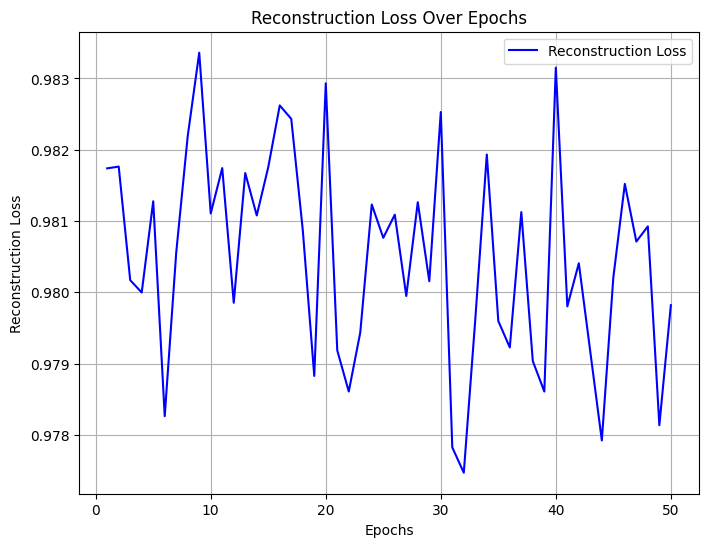

Evaluation Metrics:
Accuracy: 0.7113
F1 Score: 0.4157
Precision: 0.3557
Recall: 0.5000


C:\Users\Umer\networkenv\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


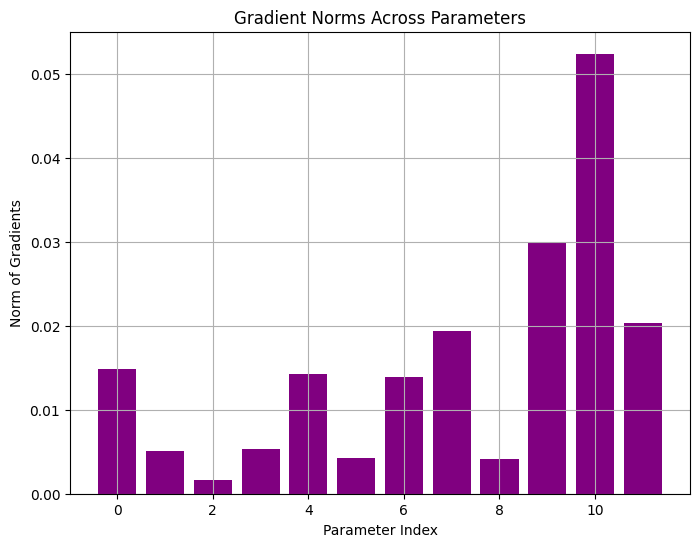

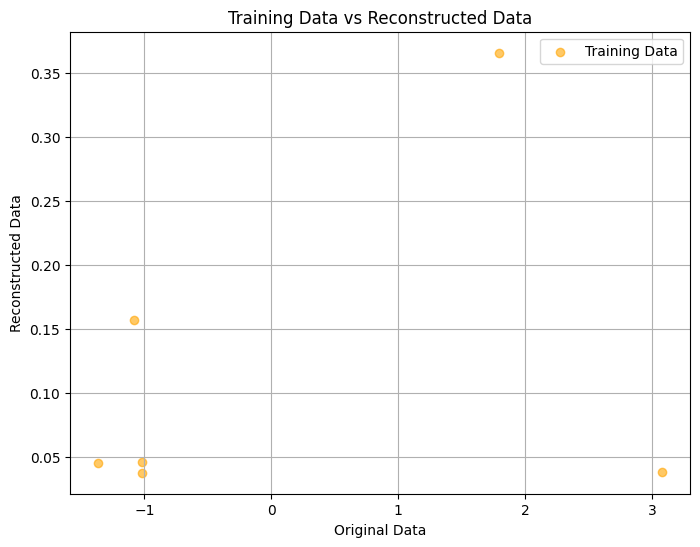

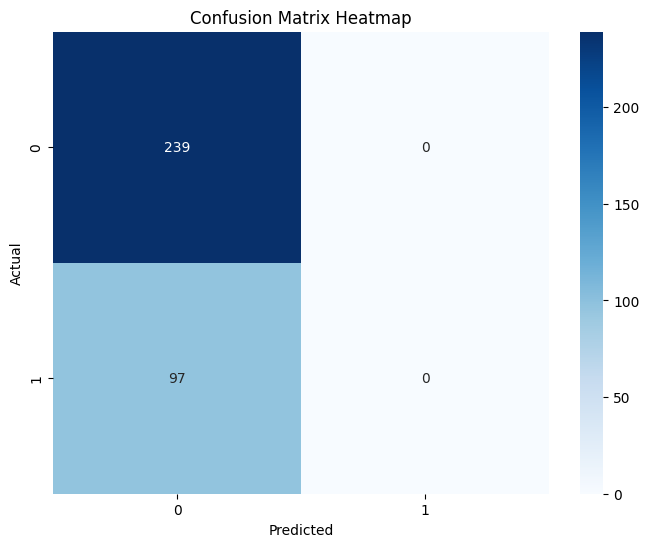

In [29]:
# Optimizer and hyperparameters
learning_rate = 0.01
epochs = 50
optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)

# Function to compute reconstruction loss
def calculate_reconstruction_loss(X, reconstructed):
    """
    Computes reconstruction loss (Mean Squared Error).
    """
    return tf.reduce_mean(tf.square(X - reconstructed))

# Tracking reconstruction loss over epochs
reconstruction_losses = []

# Gradient Descent Training Loop
for epoch in range(epochs):
    with tf.GradientTape() as tape:
        # Forward pass through the VAE
        reconstructed, _ = vae(X_train)
        
        # Compute reconstruction loss
        reconstruction_loss = calculate_reconstruction_loss(X_train, reconstructed)
    
    # Compute gradients and update weights
    gradients = tape.gradient(reconstruction_loss, vae.trainable_variables)
    optimizer.apply_gradients(zip(gradients, vae.trainable_variables))
    
    # Track the reconstruction loss
    reconstruction_losses.append(reconstruction_loss.numpy())
    print(f"Epoch {epoch + 1}/{epochs} - Reconstruction Loss: {reconstruction_loss:.4f}")

# Visualizations

# 1. Reconstruction Loss Over Epochs
plt.figure(figsize=(8, 6))
plt.plot(range(1, epochs + 1), reconstruction_losses, label='Reconstruction Loss', color='blue')
plt.title('Reconstruction Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Reconstruction Loss')
plt.legend()
plt.grid()
plt.show()

# Evaluate Model
reconstructed, _ = vae(X_test)

y_pred = (reconstructed.numpy() > 0.5).astype(int)
y_test_binary = (X_test > 0.5).astype(int)  

# Calculate metrics
accuracy = accuracy_score(y_test_binary.flatten(), y_pred.flatten())
f1 = f1_score(y_test_binary.flatten(), y_pred.flatten(), average='macro')
precision = precision_score(y_test_binary.flatten(), y_pred.flatten(), average='macro')
recall = recall_score(y_test_binary.flatten(), y_pred.flatten(), average='macro')

print("Evaluation Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")


# Gradient Norms
gradient_norms = [tf.norm(g).numpy() for g in gradients if g is not None]

plt.figure(figsize=(8, 6))
plt.bar(range(len(gradient_norms)), gradient_norms, color='purple')
plt.title('Gradient Norms Across Parameters')
plt.xlabel('Parameter Index')
plt.ylabel('Norm of Gradients')
plt.grid()
plt.show()

# Training Data vs Reconstructed Data Comparison
plt.figure(figsize=(8, 6))
plt.scatter(original_sample, reconstructed_sample, alpha=0.6, label="Training Data", color="orange")
plt.title("Training Data vs Reconstructed Data")
plt.xlabel("Original Data")
plt.ylabel("Reconstructed Data")
plt.legend()
plt.grid()
plt.show()

# 5. Confusion Matrix Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix Heatmap")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

